In [1]:
import warnings
warnings.filterwarnings("ignore") # to ignore the warnings
from platform import python_version

print(python_version())

3.7.13


In [2]:
# installing the required libraries for the dashboard creation
!pip install hvplot panel
!pip install pystan
!pip install fbprophet
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 3.1 MB 28.7 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.9 MB 22.0 MB/s 
     |████████████████████████████████| 73 kB 1.8 MB/s 
     |████████████████████████████████| 179 kB 77.9 MB/s 
     |████████████████████████████████| 45 kB 3.6 MB/s 
  Attempting uninstall: holidays
    Found existing installation: holidays 0.10.5.2
    Uninstalling holidays-0.10.5.2:
      Successfully uninstalled holidays-0.10.5.2
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled c

In [3]:
# Importing all the necessary packages

import pandas as pd # for dataframe handling

from sklearn.model_selection import train_test_split # to make the split on the dataframs

# Importing the models
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from fbprophet import Prophet
# End of models import

import matplotlib.pyplot as plt # for ploting graphs in the notebook
import numpy as np

import dateutil.parser # for handling the conversion of datetime formats
from datetime import timedelta # for operating the datetime objects

import panel as pn # for the dashboard panel
import hvplot.pandas # to make the dashboard responsive to interaction
import holoviews as hv # for dynamic operations in the dashboard

import scipy.stats as stats # used in anomaly test stat calculation
from statsmodels.tools.eval_measures import rmse # for models evaluation

from fbprophet import Prophet # high level libraby for modeling
from prophet.plot import plot_plotly, plot_components_plotly # inbuilt ploting of prophet
# End of imports

In [4]:
# This function will generate a dataframe out of a time series list

def time_to_df(list1, number_of_attributes = 3):
    '''
    This function will generate a dataframe out of a time series list
    
    :param list1: series to be passed in the form of list to generate the dataframe
    :param number_of_attributes: the number of attributes to be kept in the dataframe genarated
    :return: datafram
    '''
    df = pd.DataFrame(columns=range(number_of_attributes))
    
    for i in range(len(list1)-number_of_attributes+1):
        record = []
        
        for j in range(i,i+number_of_attributes):
            record.append(list1[j])
            
        df.loc[len(df.index)] = record
                
    return df

# This function trains the model using the input data(dataframe)

def train_and_forecast(list1, model_class_object, number_of_forecast = 5, number_of_attributes = 3):
    '''
    This function trains the model using the input data(dataframe)
    
    :param list1: series to be passed in the form of list to generate the dataframe
    :param model_class_object: object of model after initialization to use for forscasting
    :param number_of_forecast: The number of forecaste to be done and returned
    :param number_of_attributes: the number of attributes to be kept in the dataframe genarated
    :return: list of forcasted values and trained model
    '''
    input1 = time_to_df(list1, number_of_attributes)
    
    # We take last column of the features as target and rest are taken as attributes
    featureMat = input1.iloc[:, : len(input1.columns) - 1]
    label = input1[input1.columns[-1]]
    train_features, test_features, train_res, test_res= train_test_split(featureMat,label)


    # Here we are using linear regression model
    model = model_class_object
    model.fit(train_features, train_res)

    #Evaluation of the model
    y_test = model.predict(test_features)
    print("Root Mean Squared Error between actual and  predicted values: ",rmse(y_test,test_res), "--> ",int(rmse(y_test,test_res)*10000/test_res.mean()/100)," %")
    print("Mean Value of Test Dataset:", test_res.mean())
    
    # storing the forcasted values
    forecasted_values = []
    
    for i in range(number_of_forecast):
        
        features_for_forecast = list1[-number_of_attributes+1:]
        forecasted_value = int(model.predict([features_for_forecast])[0]*10)/10
        forecasted_values.append(forecasted_value)
        
        # Every forcasted value will be appended and used as a feature value for next forecast
        list1.append(forecasted_value)
        
    #print("Forcasted values: ", forecasted_values)
    return forecasted_values, model

# This function will perform the back test of the forecasting model on the given time series.

def back_test(list1, trained_model, number_of_attributes):
    '''
    This function will perform the back test of the forecasting model on the given time series.
    
    :param list1: series to be passed in the form of list on which the model will be tested
    :param trained_model: The trained model
    :param number_of_attributes: the number of attributes on which the model is trained
    :return: list of forecasted values for the time series 
    '''
    back_test_preds = []
    
    # Filling the initial value where forecast is not possible by the given values of the series itself
    for k in range(number_of_attributes-1):
        back_test_preds.append(list1[k])
    
    # Forecasting and storing values from the begining of the series using trained model
    for i in range(len(list1)-number_of_attributes+1):
        forecasted_value = int(trained_model.predict([list1[i:i+number_of_attributes-1]])[0]*10)/10
        back_test_preds.append(forecasted_value)
            
    return back_test_preds
    

# This function calculates the test_states for the GESD testing
def calculate_test_stat(y, iteration):
    '''
    This function calculates the test_states for the GESD testing
    
    :param y: Series on which GESD testing is being done.
    :param iteration: State for which iteration the value is being calculated
    :return: maximum deviation, index of point with maximum deviation, the value of that point
    '''
    std_dev = np.std(y) # standard deviation of the series
    avg_y = np.mean(y) # mean of the series
    abs_val_minus_avg = abs(y - avg_y) # Distance of values(in series) from the mean
    max_of_deviations = max(abs_val_minus_avg) # maximum distance
    max_ind = np.argmax(abs_val_minus_avg) # index of the point having maximam deviation
    cal = max_of_deviations/ std_dev # calculation of devaite in terms of std.dev
    
    return cal, max_ind,y[max_ind]

# This function calculates the critical value which needs to be compared with the test state to check hypothesis
def calculate_critical_value(size, alpha, iteration):
    '''
    This function calculates the critical value which needs to be compared with the test state to check hypothesis
    
    :param size: Size of the series
    :param alpha: Significant value 
    :param iteration: State for which iteration the value is being calculated
    :return: critical value
    '''
    t_dist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(t_dist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(t_dist))
    critical_value = numerator / denominator
    return critical_value

# Calculating Anomaly using GESD testing 
def GESD(attribute, alpha, frame_of_detection):
    '''
    Calculating Anomaly using GESD testing 
    
    :param attribute: the attribute on which the GESD needs to be applied
    :param alpha: Significant value for calculating the critical value of the test
    :param frame_of_detection: the frame in which the extreme outlier or the anomaly needs to be detected
    :return: List of the indices for anomalies
    '''
    input_series = list(attribute)
    stats = []
    critical_vals = []
    anomily_list_index = []
    for iterations in range(1, frame_of_detection + 1):
        stat, max_index, max_index_value = calculate_test_stat(input_series, iterations) # calculating the test state
        critical = calculate_critical_value(len(input_series), alpha, iterations) # calculating the critical value
        input_series = np.delete(input_series, max_index) 
        
        critical_vals.append(critical)
        stats.append(stat)
        
        # testing the hypothesis
        if stat > critical:
            max_i = iterations
            
            anomily_list_index.append(attribute.index(max_index_value)) # appending the extreme outlier as anomaly
        
    
    return anomily_list_index




In [61]:
datafiles = ["PFE.csv","SPOT.csv","TSLA.csv"] # name of the datafiles along with the address
company_names = ["Pfizer", "Spotify", "Tesla"] # names of the company names corresponding to the data files
DATA = []  # list that will contain all the datafiles in terms of dataframes

# Readinging the files as dataframes
for file in datafiles:
    df = pd.read_csv(file)
    print("Reading ",file)
    DATA.append(df)
    

Reading  PFE.csv
Reading  SPOT.csv
Reading  TSLA.csv


In [6]:
# check missing values
for df in DATA:
    print("*"*40)
    df.info()

# Datasets have no missing values

****************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259 entries, 0 to 1258
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1259 non-null   object 
 1   Open       1259 non-null   float64
 2   High       1259 non-null   float64
 3   Low        1259 non-null   float64
 4   Close      1259 non-null   float64
 5   Adj Close  1259 non-null   float64
 6   Volume     1259 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 69.0+ KB
****************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 978 entries, 0 to 977
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       978 non-null    object 
 1   Open       978 non-null    float64
 2   High       978 non-null    float64
 3   Low        978 non-null    float64
 4   Close      978 non-null    float64
 5   

Working on  Pfizer  dataset
Working on  TSLA.csv  dataset for anomalies.
Anomalous dates for  Open  : 
 ['2021-12-20', '2021-12-21', '2021-12-17', '2021-12-23', '2021-12-22', '2021-12-28']


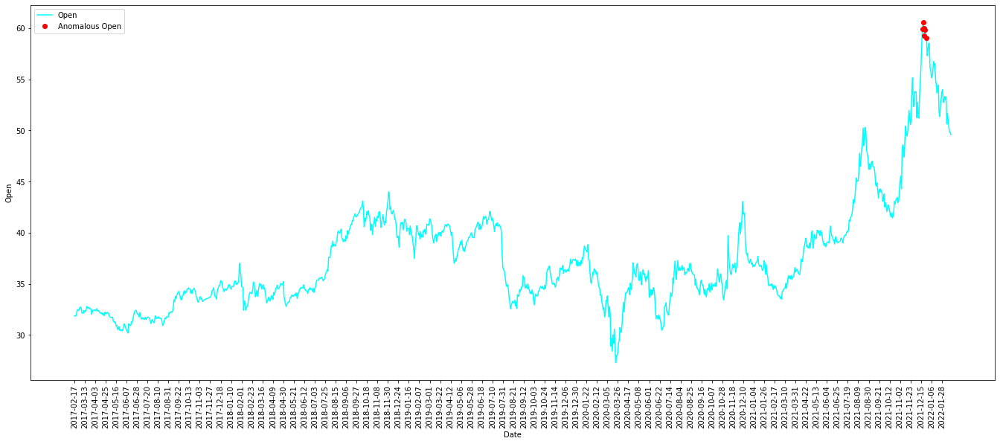

Anomalous dates for  High  : 
 ['2021-12-20', '2021-12-16', '2021-12-17', '2021-12-22', '2021-12-23', '2021-12-21', '2021-12-31', '2021-12-27']


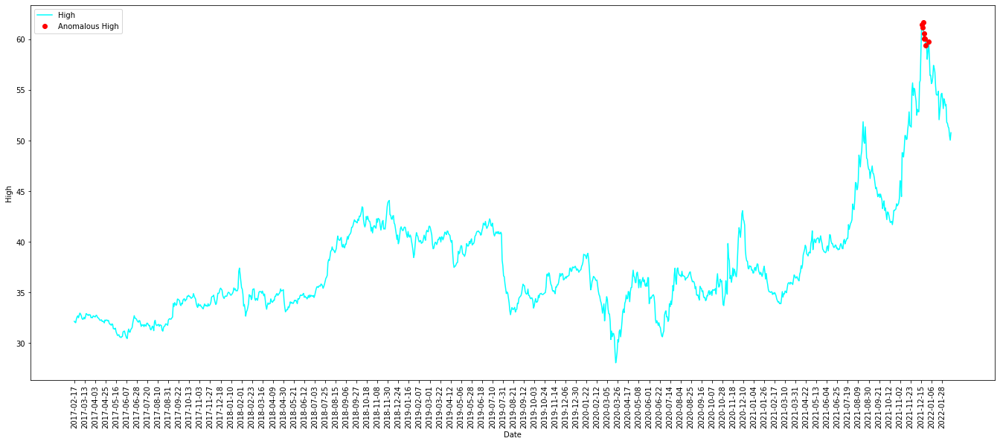

Anomalous dates for  Low  : 
 ['2021-12-20', '2021-12-22']


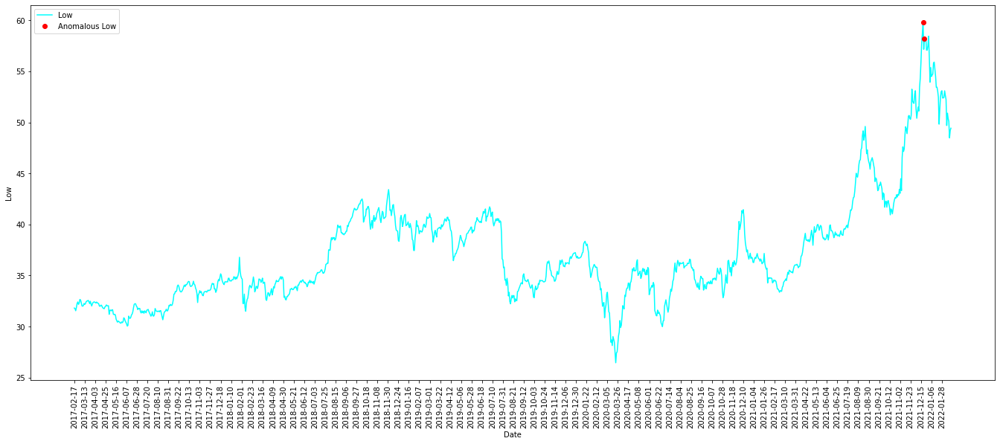

Anomalous dates for  Close  : 
 ['2021-12-16', '2021-12-20', '2021-12-22', '2021-12-17', '2021-12-21', '2021-12-15', '2021-12-23']


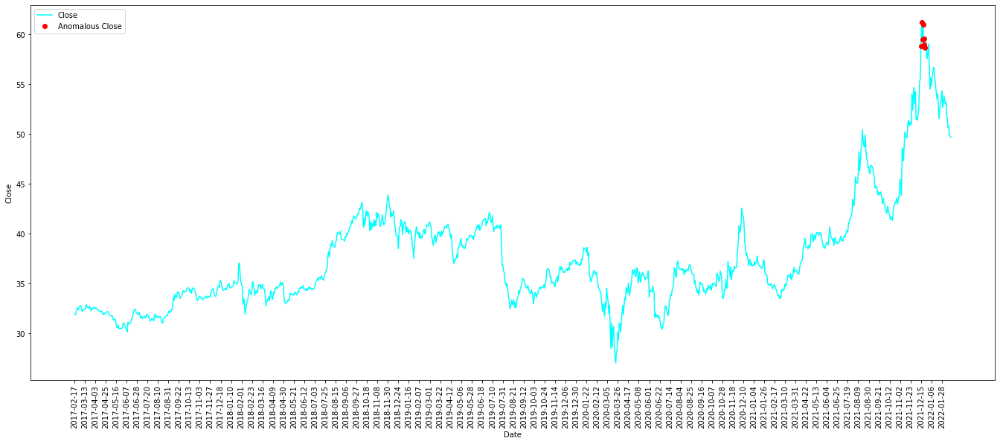

Anomalous dates for  Adj Close  : 
 ['2021-12-16', '2021-12-20']


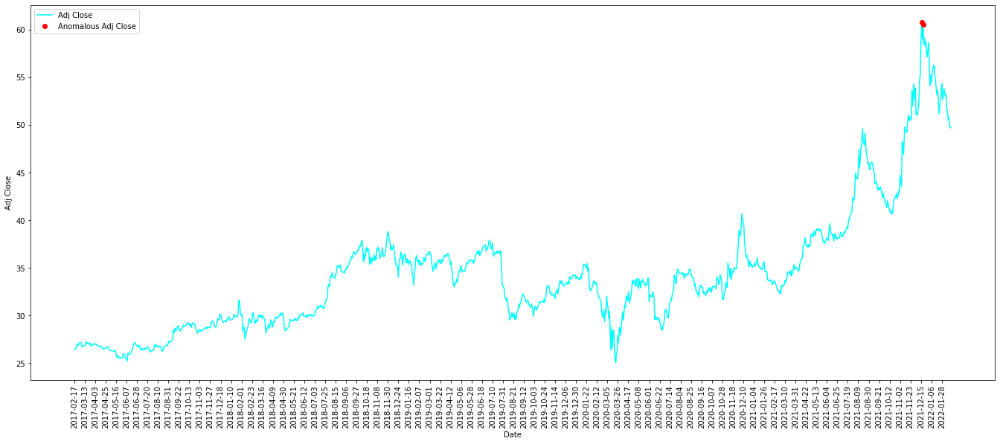

Anomalous dates for  Volume  : 
 ['2020-11-09', '2021-11-05', '2021-12-17', '2019-07-30', '2020-12-14', '2020-07-22', '2021-08-23', '2021-08-18', '2020-12-08', '2020-12-09', '2020-12-02', '2021-02-02', '2021-08-10', '2020-11-10', '2020-06-01', '2021-05-05', '2020-11-16', '2021-12-15', '2021-12-16', '2019-03-15', '2020-07-01', '2021-11-29', '2020-12-01']


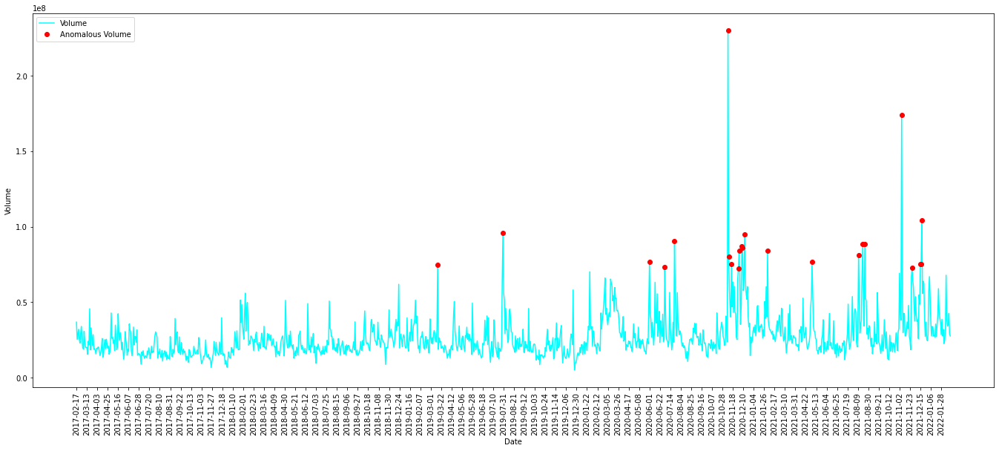

Anomalous dates for  365_day_model_for_Open_via_linear_model.ElasticNet  : 
 ['2021-12-22', '2021-12-21', '2021-12-27', '2021-12-23', '2021-12-28', '2021-12-20']


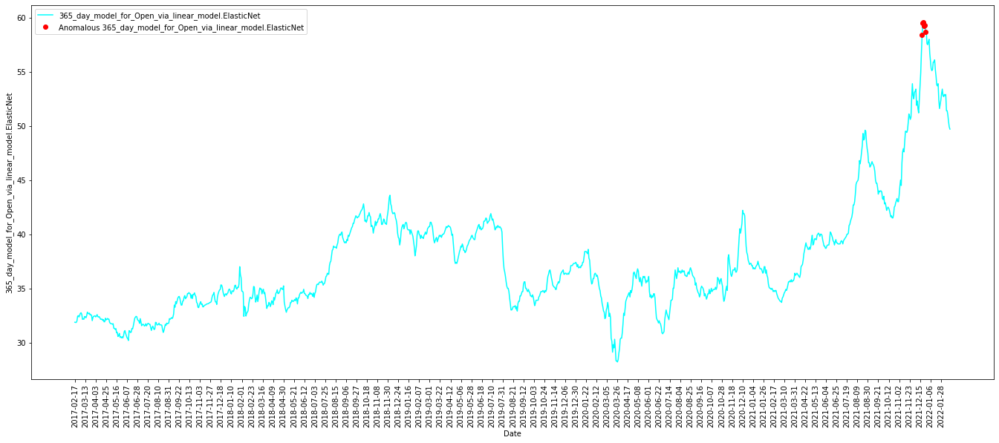

Anomalous dates for  365_day_model_for_High_via_linear_model.ElasticNet  : 
 ['2021-12-21', '2021-12-20', '2021-12-23', '2021-12-22', '2021-12-27', '2021-12-17', '2021-12-28', '2021-12-29']


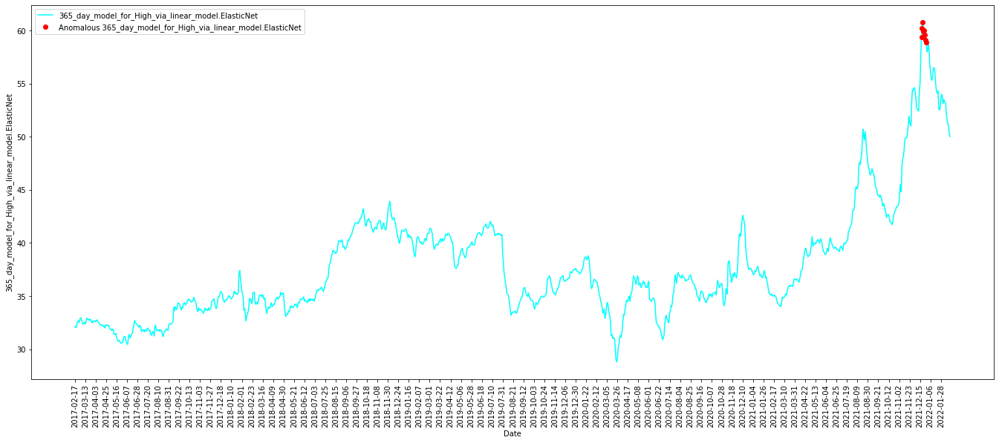

Anomalous dates for  365_day_model_for_Low_via_linear_model.ElasticNet  : 
 ['2021-12-21']


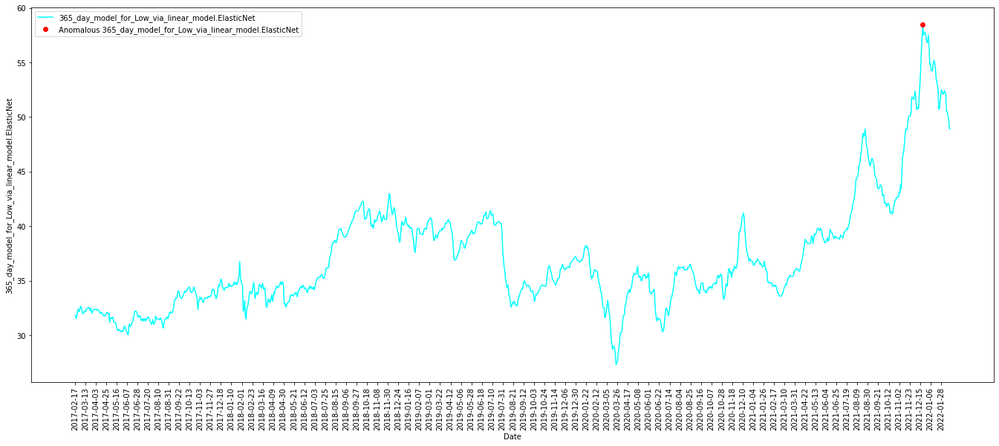

Anomalous dates for  365_day_model_for_Close_via_linear_model.ElasticNet  : 
 ['2021-12-21', '2021-12-20', '2021-12-17', '2021-12-17', '2021-12-23', '2021-12-28', '2021-12-27']


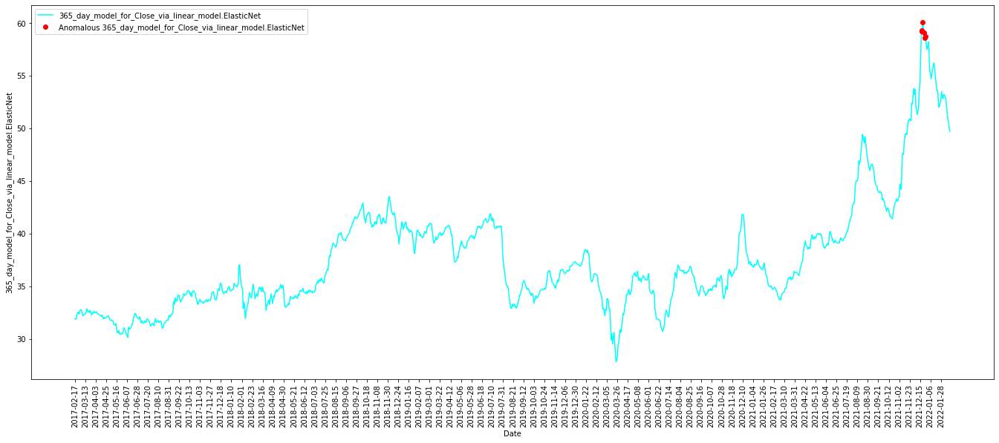

Anomalous dates for  365_day_model_for_Adj Close_via_linear_model.ElasticNet  : 
 []


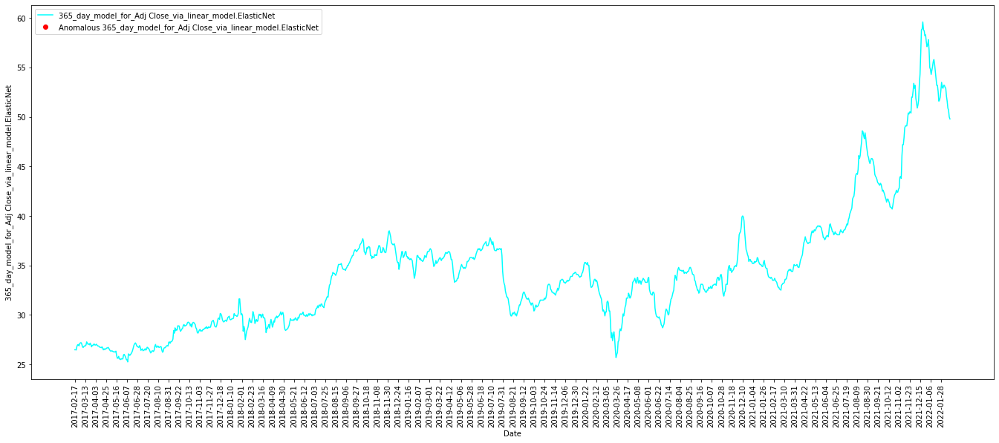

Anomalous dates for  365_day_model_for_Volume_via_linear_model.ElasticNet  : 
 ['2021-11-05', '2020-11-09', '2020-11-10', '2021-11-22', '2021-03-12']


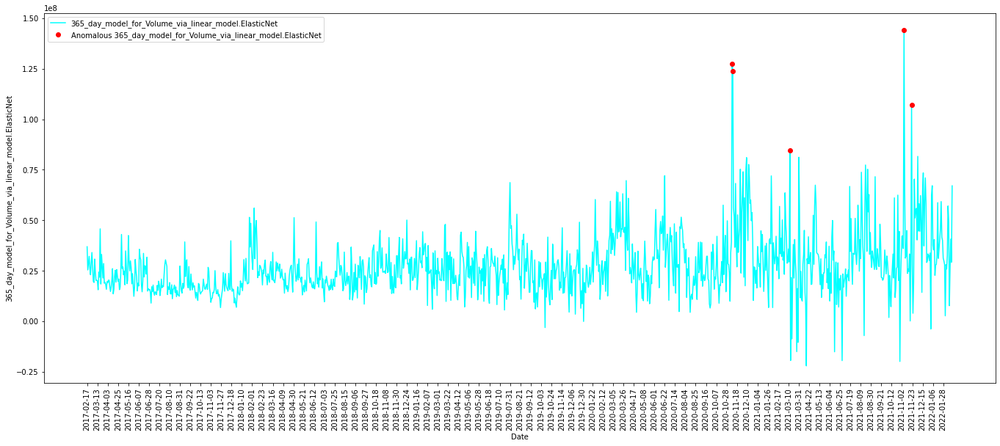

Working on  Spotify  dataset
Working on  TSLA.csv  dataset for anomalies.
Anomalous dates for  Open  : 
 []


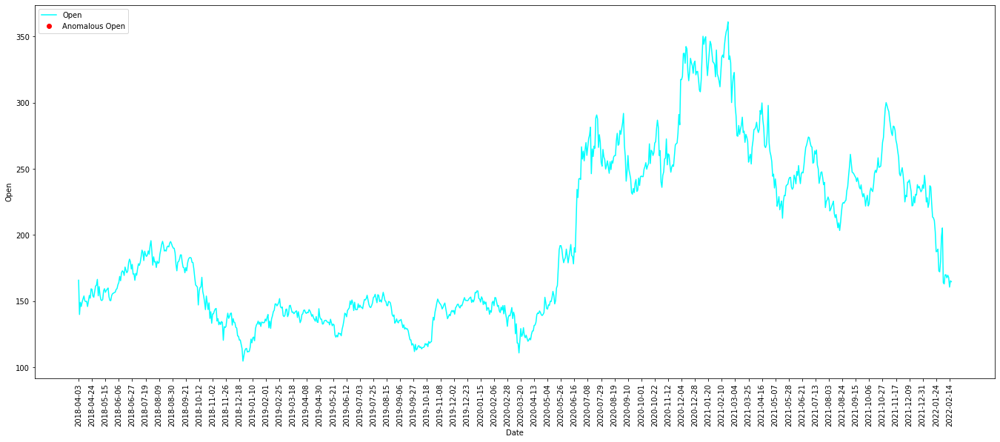

Anomalous dates for  High  : 
 []


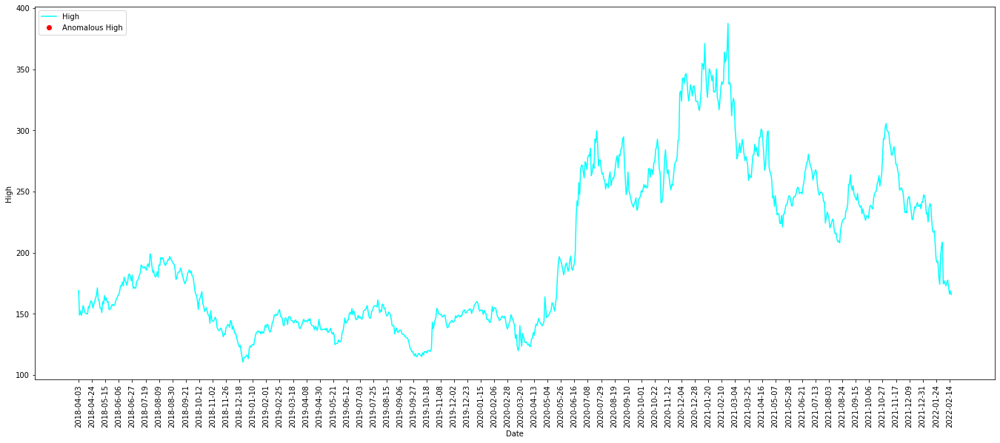

Anomalous dates for  Low  : 
 []


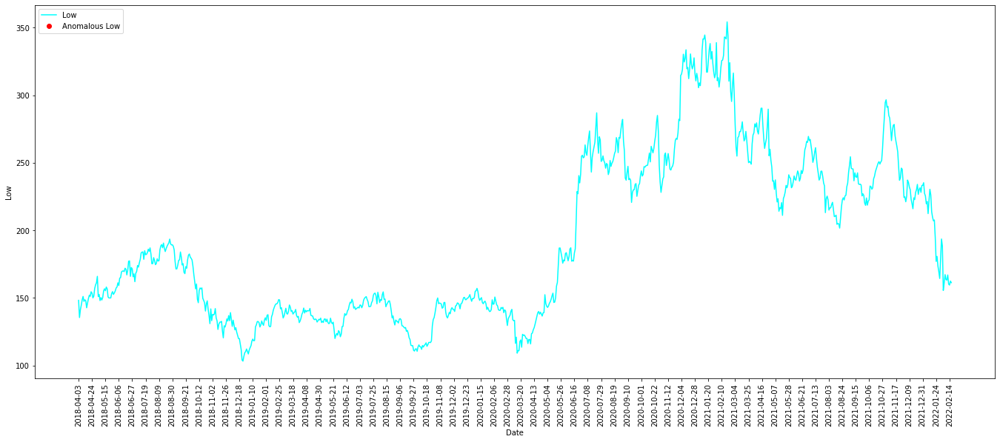

Anomalous dates for  Close  : 
 []


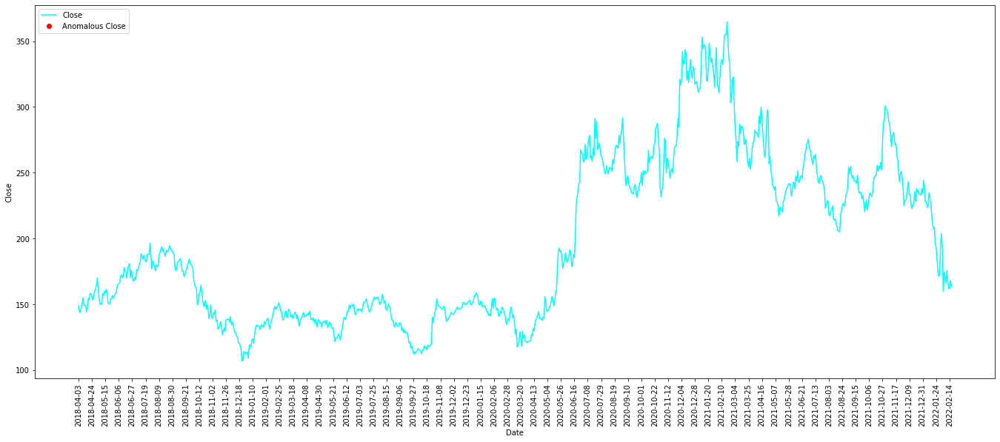

Anomalous dates for  Adj Close  : 
 []


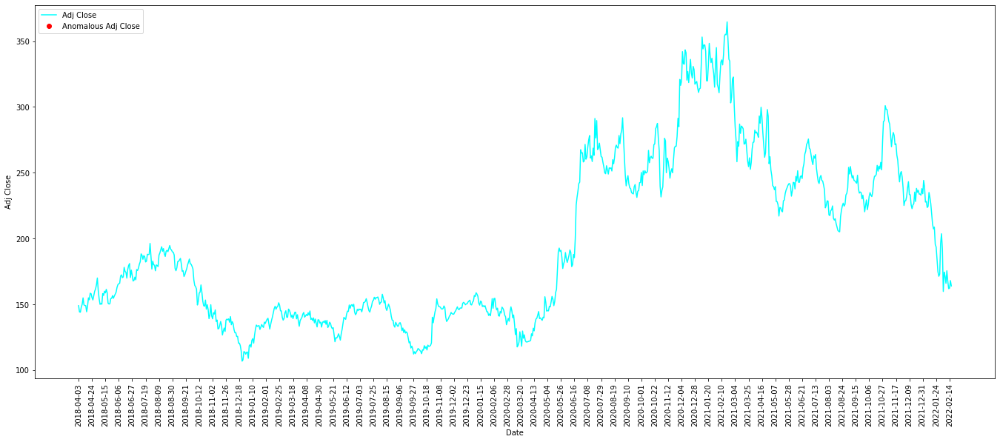

Anomalous dates for  Volume  : 
 ['2018-04-03', '2022-02-03', '2020-06-19', '2020-06-18', '2018-04-04', '2018-05-03', '2019-10-28', '2019-06-28', '2018-11-01', '2020-06-25', '2020-12-02', '2020-06-23', '2021-04-28', '2019-02-06', '2018-04-05', '2021-07-28', '2018-05-02', '2019-04-29', '2022-02-02', '2020-06-26', '2020-06-22', '2021-02-03', '2022-02-04', '2020-04-29', '2018-05-07', '2020-10-29', '2020-09-16', '2019-07-31', '2020-07-06', '2020-07-22']


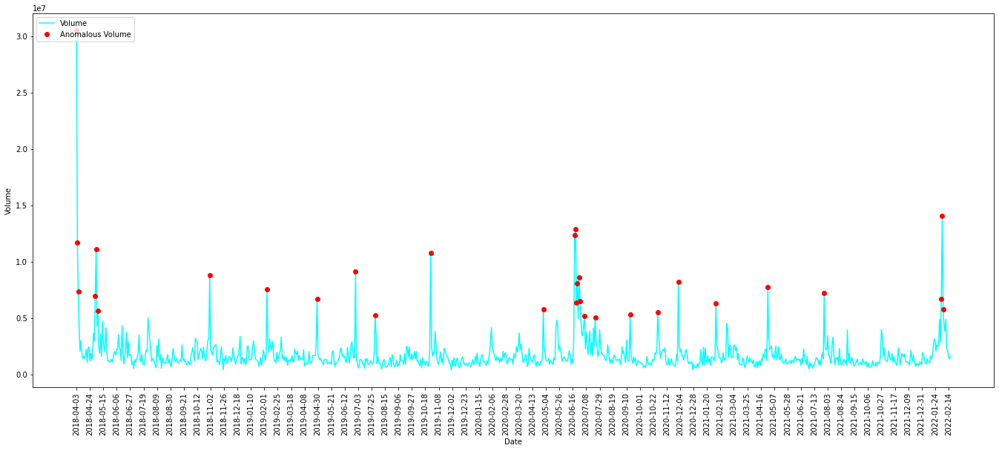

Anomalous dates for  365_day_model_for_Open_via_linear_model.ElasticNet  : 
 []


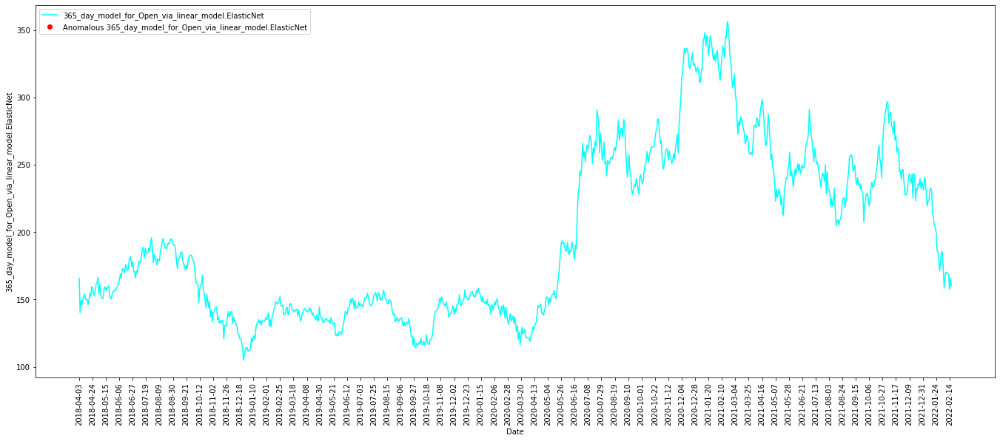

Anomalous dates for  365_day_model_for_High_via_linear_model.ElasticNet  : 
 []


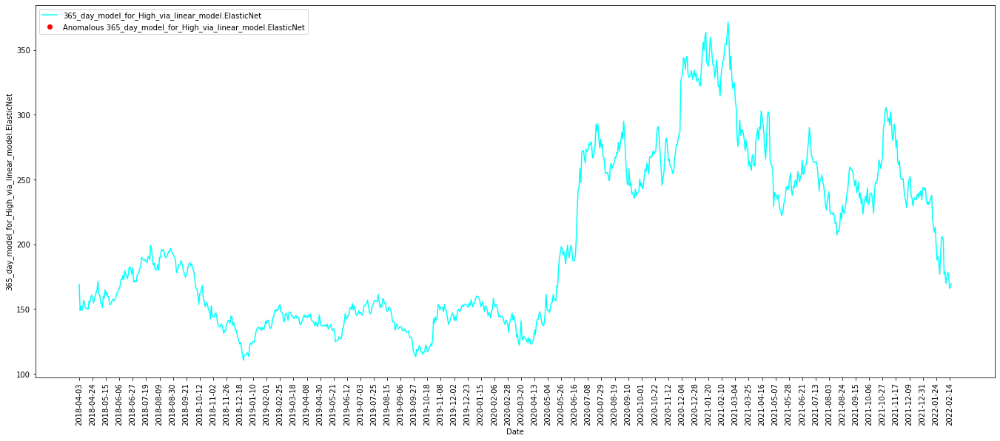

Anomalous dates for  365_day_model_for_Low_via_linear_model.ElasticNet  : 
 []


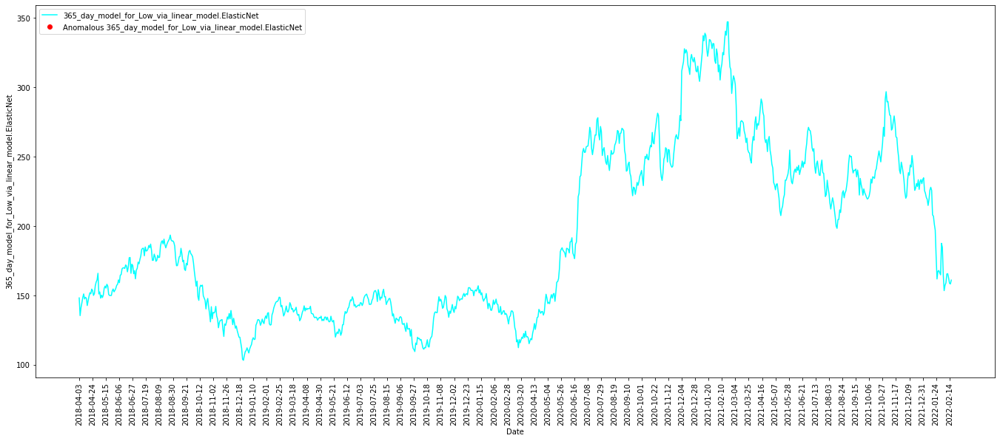

Anomalous dates for  365_day_model_for_Close_via_linear_model.ElasticNet  : 
 []


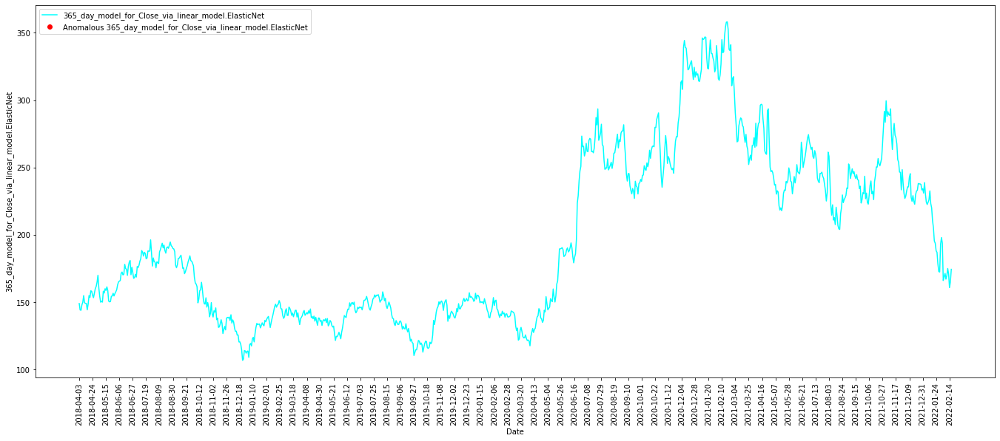

Anomalous dates for  365_day_model_for_Adj Close_via_linear_model.ElasticNet  : 
 []


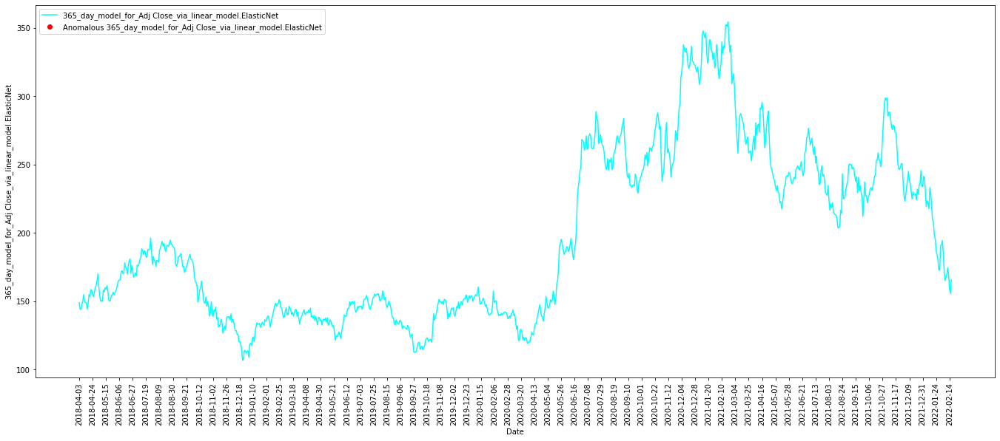

Anomalous dates for  365_day_model_for_Volume_via_linear_model.ElasticNet  : 
 ['2018-04-03', '2018-04-04', '2021-04-07', '2020-06-19', '2018-05-03', '2022-02-03', '2021-06-22', '2021-09-29', '2020-12-30', '2021-02-05', '2021-04-26', '2020-06-18', '2019-06-28', '2021-08-27', '2018-11-01', '2020-12-22', '2019-09-30', '2019-10-28', '2020-07-10', '2021-10-28', '2021-01-13', '2019-02-06', '2018-04-05', '2021-04-15', '2020-06-25', '2020-06-23', '2020-12-09', '2020-06-22', '2018-05-02', '2021-04-05']


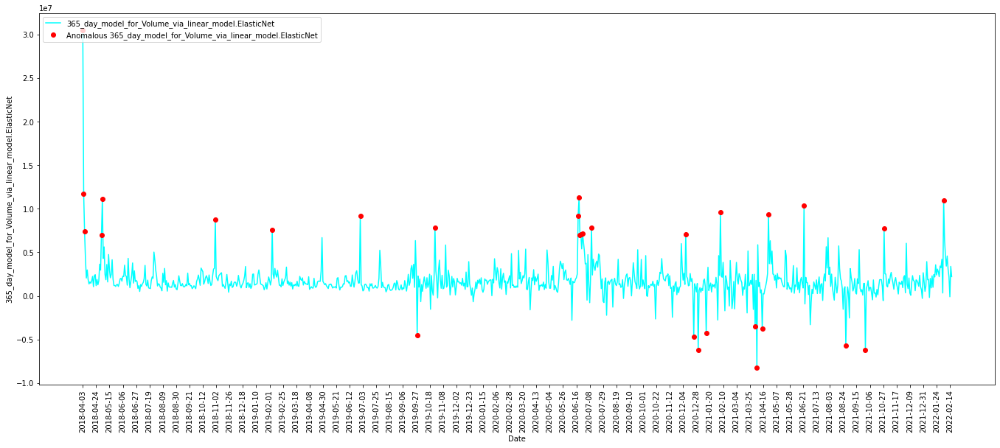

Working on  Tesla  dataset
Working on  TSLA.csv  dataset for anomalies.
Anomalous dates for  Open  : 
 []


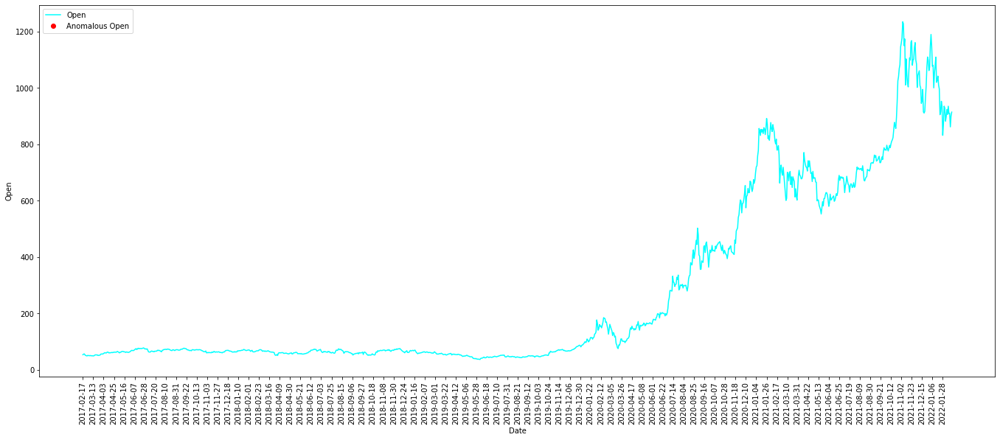

Anomalous dates for  High  : 
 []


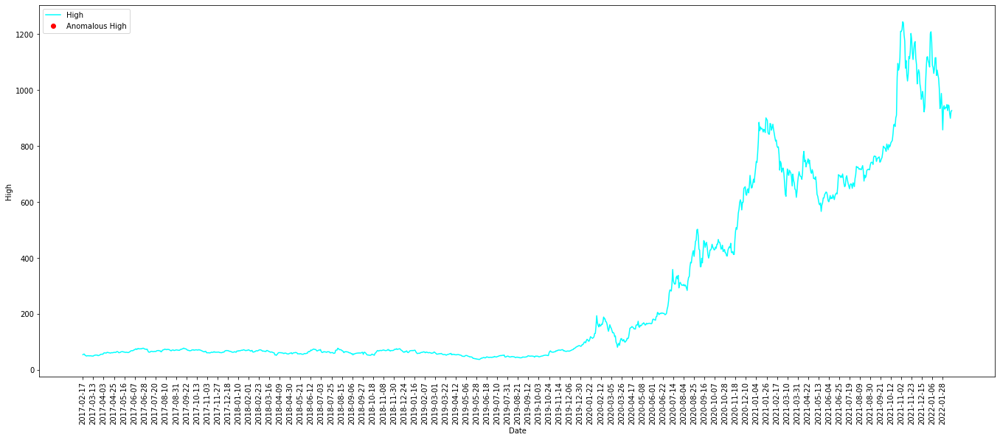

Anomalous dates for  Low  : 
 []


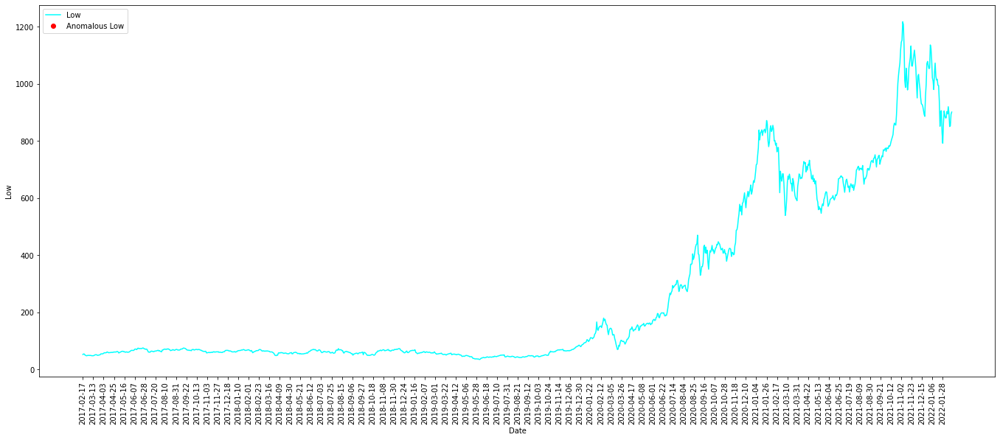

Anomalous dates for  Close  : 
 []


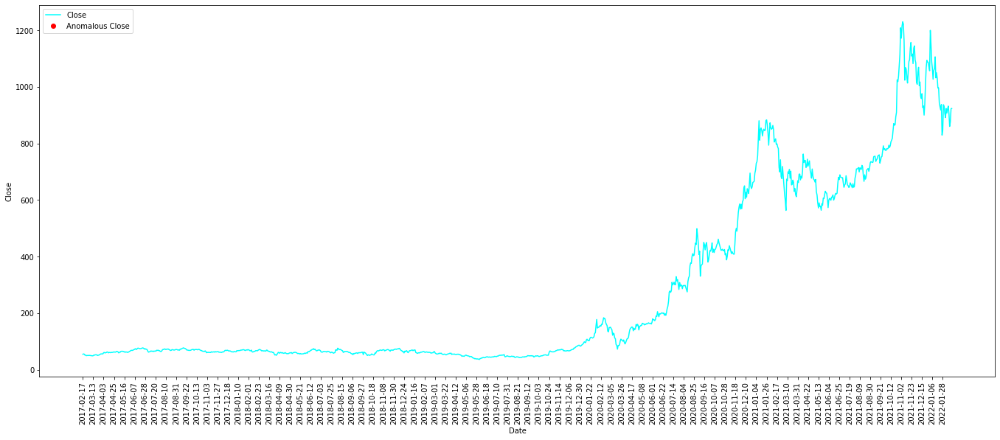

Anomalous dates for  Adj Close  : 
 []


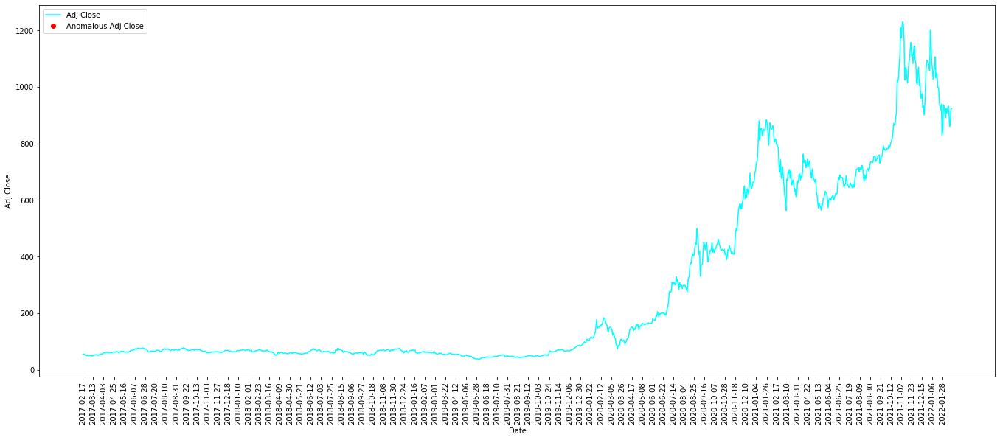

Anomalous dates for  Volume  : 
 ['2020-02-04', '2020-02-05', '2020-02-03', '2020-12-18', '2020-02-06', '2020-07-13', '2018-09-28', '2020-05-01', '2020-01-22', '2020-01-08', '2018-08-07', '2020-04-14', '2020-03-19', '2019-10-25', '2019-10-24']


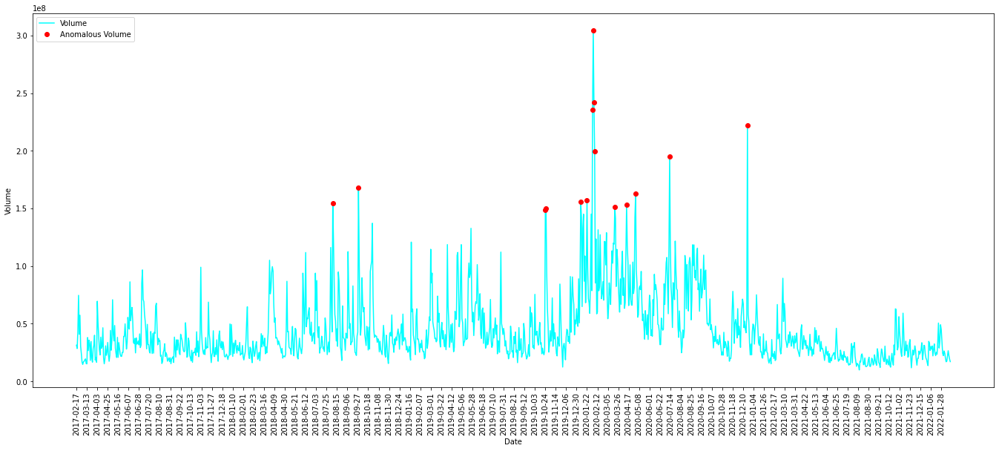

Anomalous dates for  365_day_model_for_Open_via_linear_model.ElasticNet  : 
 []


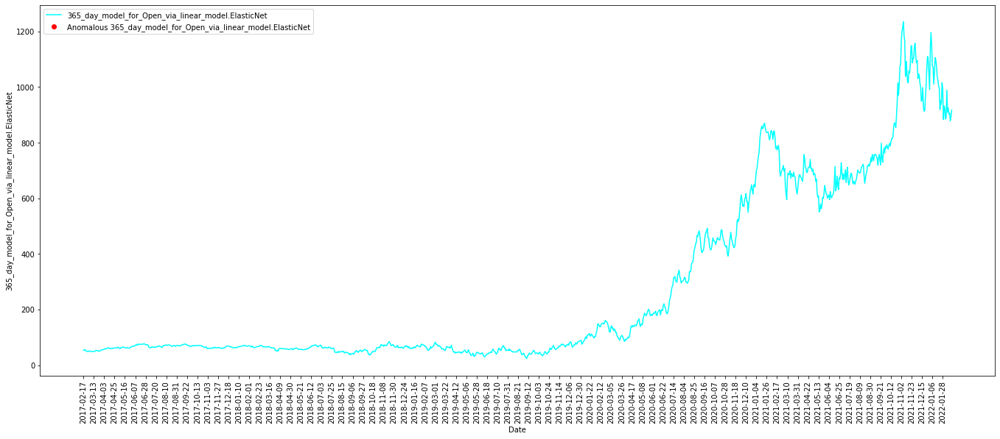

Anomalous dates for  365_day_model_for_High_via_linear_model.ElasticNet  : 
 []


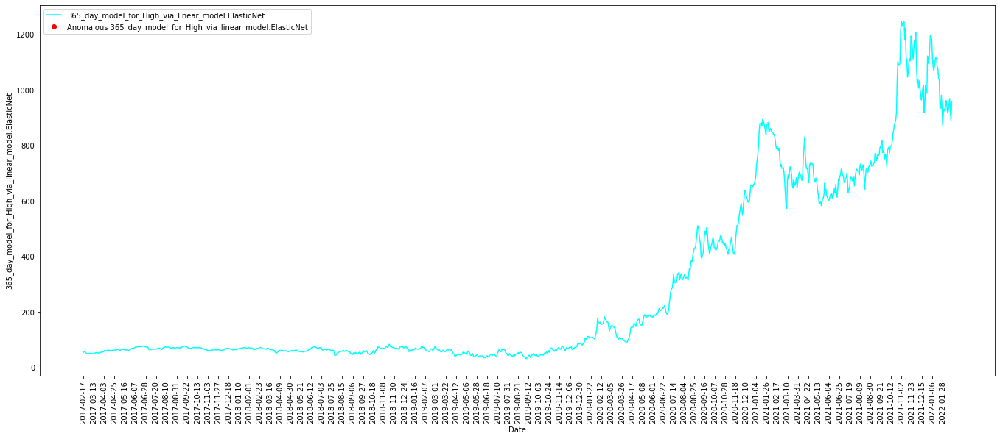

Anomalous dates for  365_day_model_for_Low_via_linear_model.ElasticNet  : 
 []


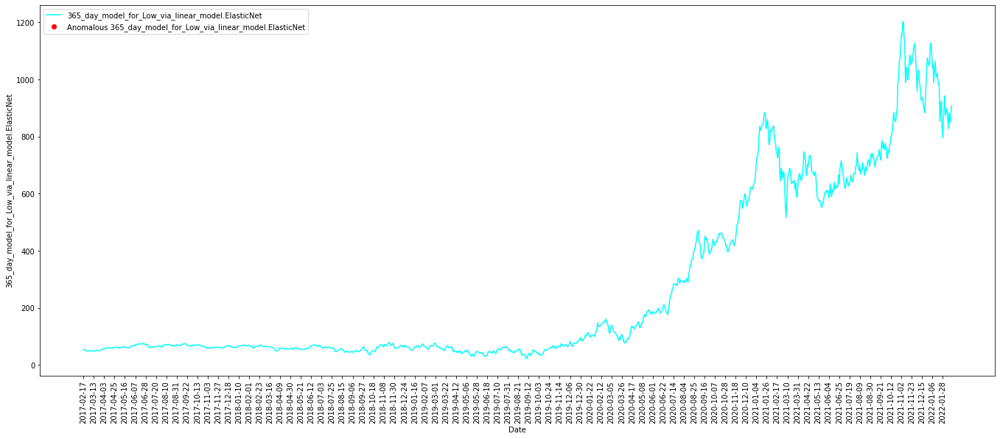

Anomalous dates for  365_day_model_for_Close_via_linear_model.ElasticNet  : 
 []


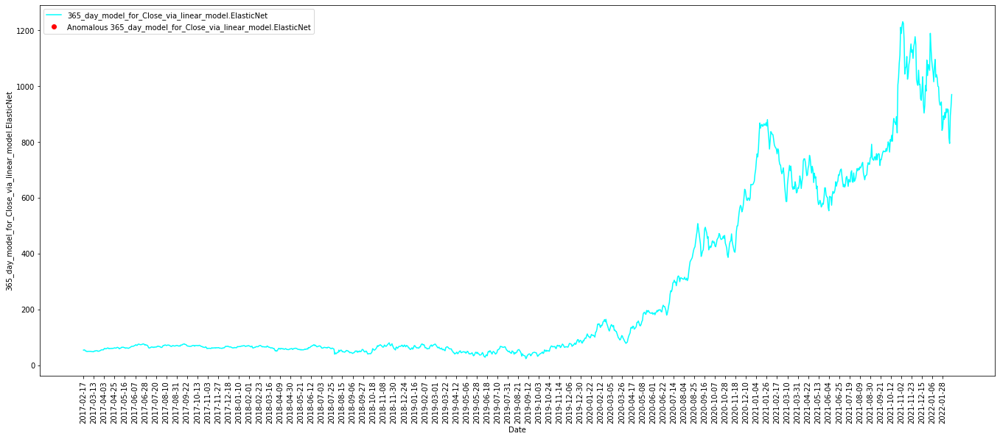

Anomalous dates for  365_day_model_for_Adj Close_via_linear_model.ElasticNet  : 
 []


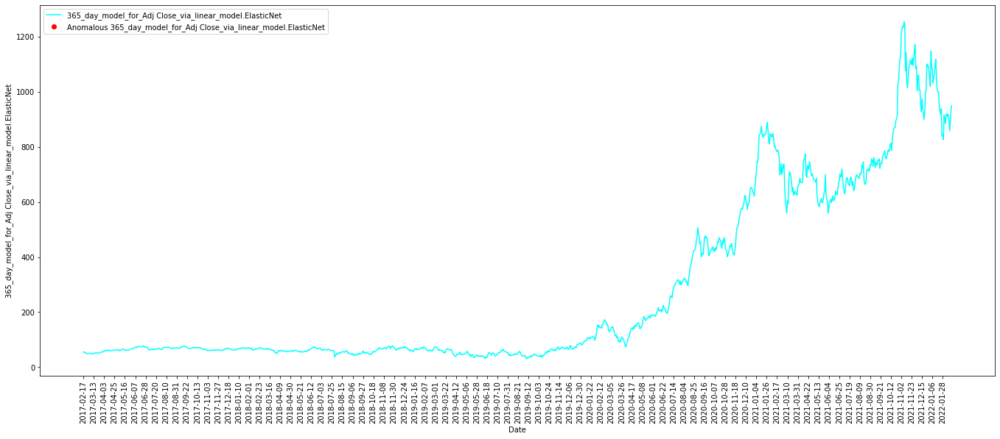

Anomalous dates for  365_day_model_for_Volume_via_linear_model.ElasticNet  : 
 ['2020-02-04', '2020-02-05', '2020-12-21', '2020-02-06']


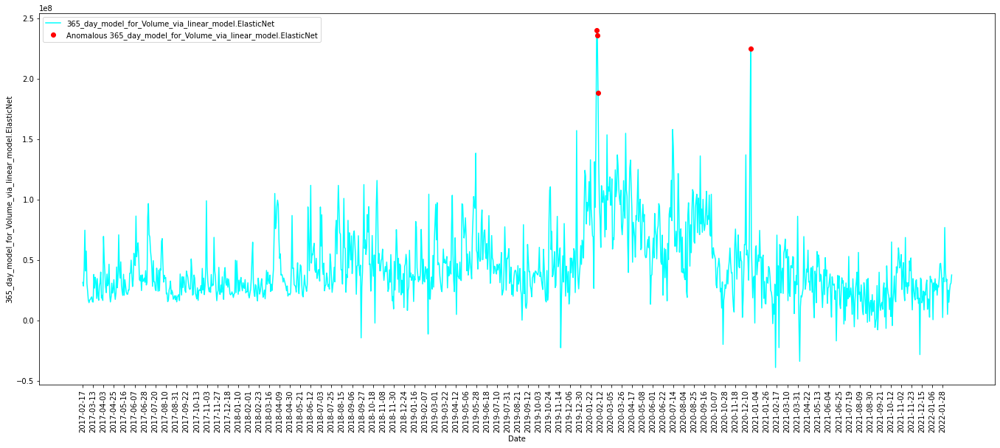

In [47]:
# working on the anomalies detection to look into the behaviour of stock in the frame of 30 days

datafiles = ["PFE.csv","SPOT.csv","TSLA.csv"] # names of the data files along with the address
company_names = ["Pfizer", "Spotify", "Tesla"] # names of the companies corresponding to the data files.
index = 0

for df in DATA:
    print("Working on ",company_names[index], " dataset")
    index = index+1
    print("Working on ",file, " dataset for anomalies.",)
    data = df.copy()
    anomaly ={} # dictionary storing the indices of the the anomalies and attribute name for the data file as key- value pair
    
    for i in data.columns.to_list():
        
        #checking the anomalies column by column
        if i != "Date": # skipping the "Date" attribute
            columns_value = data[i].dropna(axis = 0).to_list() # Handling the missing values if in case there are.
            anom_index_list = GESD(columns_value, alpha = 0.05, frame_of_detection = 30) # running the anomaly test

            if len(anom_index_list)>0: # checking if there is anomaly
                anomaly[i] = anom_index_list
            
            
            # ploting the anomalies on the attributes
            fig = plt.figure(figsize =(18, 7))
   
            ax = fig.add_axes([0,0,1,1])

            date_list = data["Date"].to_list()
            values_for_attribute = data[i]
          
            anomaly_date_list = data.iloc[anom_index_list]["Date"]
            anomaly_vale_list = data.iloc[anom_index_list][i]
            print("Anomalous dates for ",i," : \n", anomaly_date_list.to_list())
            ax.plot(date_list, values_for_attribute,'-',color='cyan', label = i)
            ax.plot(anomaly_date_list, anomaly_vale_list,'o',color='red', label = "Anomalous "+i)
            ax.legend(loc="upper left")

            ax.set_ylabel(i)
            ax.set_xlabel("Date")
            
       
            
            ax.set_xticks(ax.get_xticks()[::15])
            for tick in ax.get_xticklabels():
              tick.set_rotation(90)
      

            plt.show()
            # end of ploting
        

Working on  Pfizer  dataset
Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Open ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  0.7099980268793843 -->  1  %
Mean Value of Test Dataset: 39.288808522321425
Forecasted  Open :


,Date,Open
0,2022-02-17,49.4
1,2022-02-18,49.2
2,2022-02-19,49.0
3,2022-02-20,48.8
4,2022-02-21,48.6
5,2022-02-22,48.4
6,2022-02-23,48.2


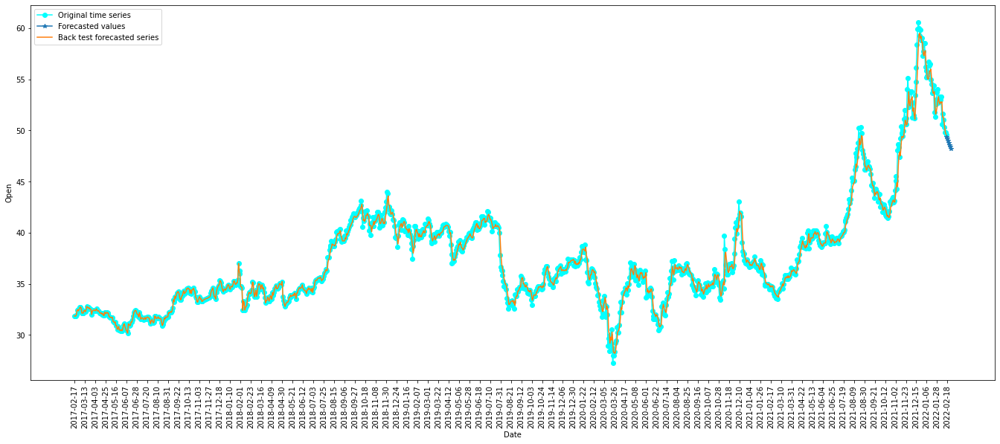

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' High ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  0.7552486206223097 -->  1  %
Mean Value of Test Dataset: 39.56190625
Forecasted  High :


,Date,High
0,2022-02-17,50.4
1,2022-02-18,50.2
2,2022-02-19,50.1
3,2022-02-20,50.0
4,2022-02-21,49.8
5,2022-02-22,49.7
6,2022-02-23,49.6


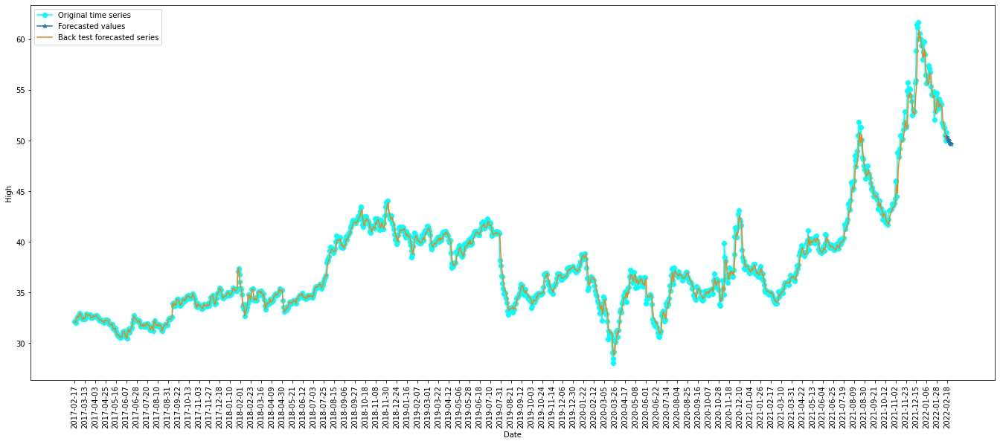

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Low ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  0.6009282934486208 -->  1  %
Mean Value of Test Dataset: 38.943534687500005
Forecasted  Low :


,Date,Low
0,2022-02-17,49.1
1,2022-02-18,49.0
2,2022-02-19,48.9
3,2022-02-20,48.8
4,2022-02-21,48.7
5,2022-02-22,48.6
6,2022-02-23,48.5


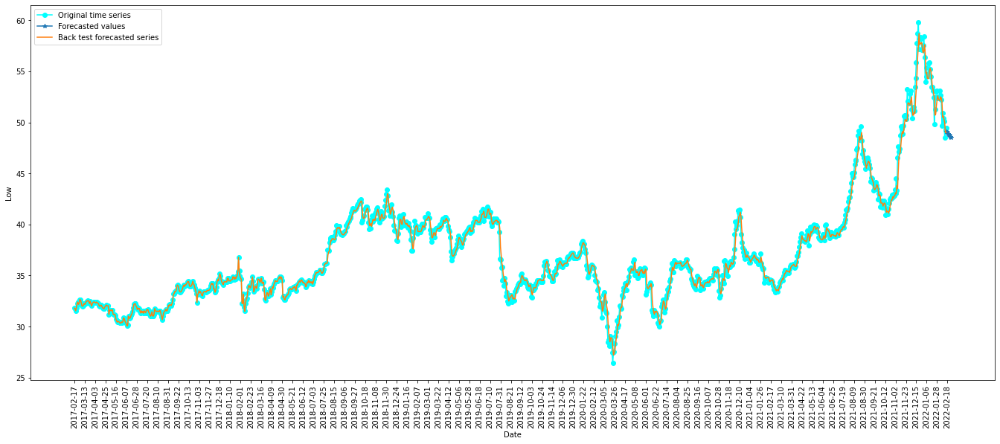

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Close ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  0.7114924604043747 -->  1  %
Mean Value of Test Dataset: 38.71394625446429
Forecasted  Close :


,Date,Close
0,2022-02-17,49.4
1,2022-02-18,49.2
2,2022-02-19,49.0
3,2022-02-20,48.8
4,2022-02-21,48.6
5,2022-02-22,48.4
6,2022-02-23,48.2


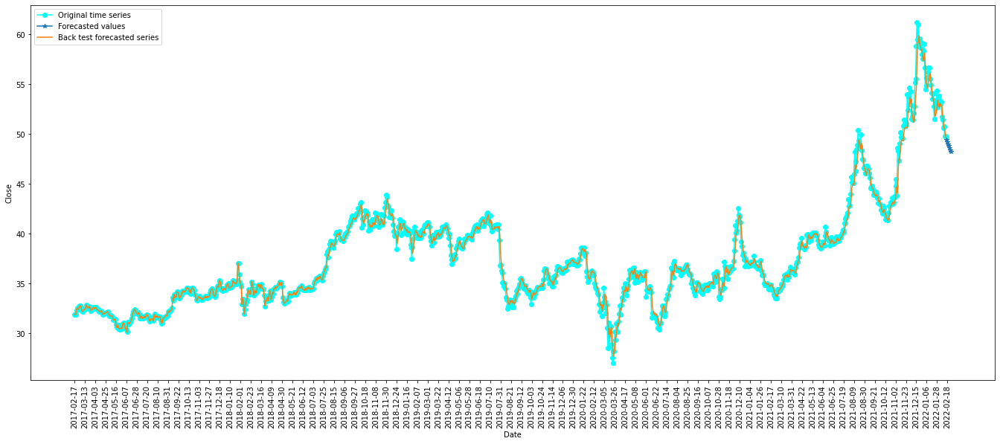

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Adj Close ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  0.6504546704049068 -->  1  %
Mean Value of Test Dataset: 37.11285236607143
Forecasted  Adj Close :


,Date,Adj Close
0,2022-02-17,49.6
1,2022-02-18,49.5
2,2022-02-19,49.4
3,2022-02-20,49.4
4,2022-02-21,49.3
5,2022-02-22,49.2
6,2022-02-23,49.1


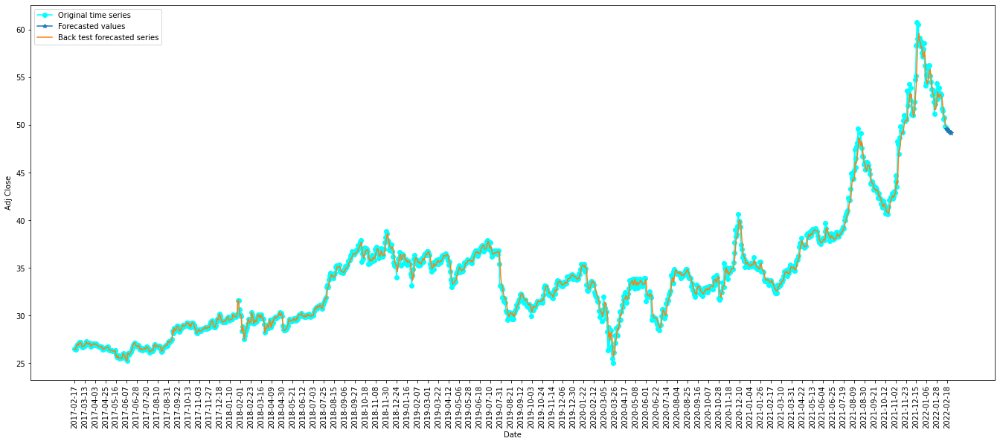

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Volume ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  24598634.98506605 -->  83  %
Mean Value of Test Dataset: 29376717.20982143
Forecasted  Volume :


,Date,Volume
0,2022-02-17,12460130.2
1,2022-02-18,28838720.0
2,2022-02-19,39723497.2
3,2022-02-20,61066191.8
4,2022-02-21,55334348.4
5,2022-02-22,15134280.1
6,2022-02-23,89703751.1


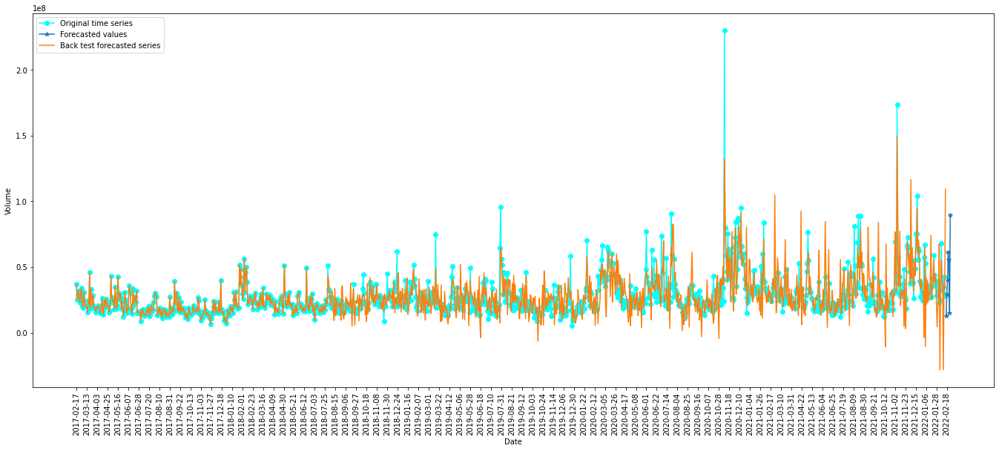

Working on  Pfizer  dataset
Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Open ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  10.31589763683933 -->  4  %
Mean Value of Test Dataset: 230.7175973636364
Forecasted  Open :


,Date,Open
0,2022-02-17,175.9
1,2022-02-18,197.3
2,2022-02-19,195.9
3,2022-02-20,191.7
4,2022-02-21,185.6
5,2022-02-22,183.5
6,2022-02-23,175.6


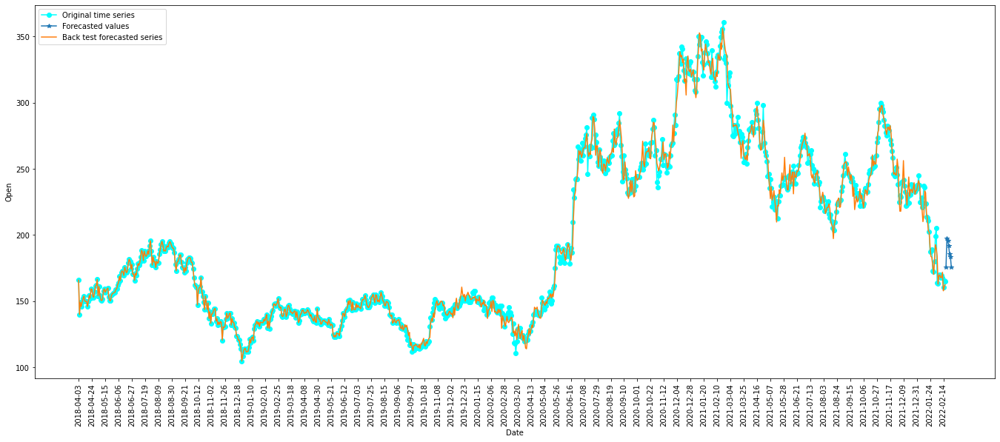

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' High ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  10.113716184036498 -->  4  %
Mean Value of Test Dataset: 227.4943512987013
Forecasted  High :


,Date,High
0,2022-02-17,167.6
1,2022-02-18,172.8
2,2022-02-19,177.2
3,2022-02-20,169.1
4,2022-02-21,182.5
5,2022-02-22,182.3
6,2022-02-23,170.3


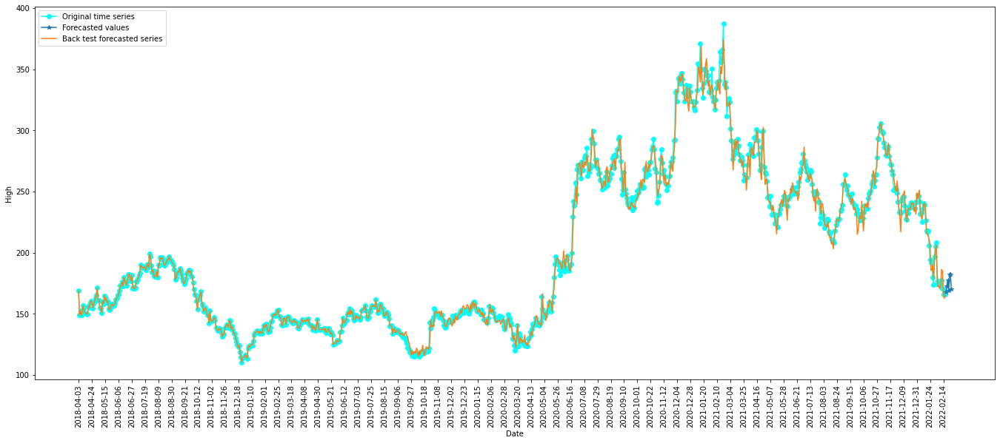

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Low ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  8.788614880698166 -->  3  %
Mean Value of Test Dataset: 221.30921424675327
Forecasted  Low :


,Date,Low
0,2022-02-17,173.5
1,2022-02-18,181.8
2,2022-02-19,177.9
3,2022-02-20,172.8
4,2022-02-21,162.0
5,2022-02-22,151.0
6,2022-02-23,157.3


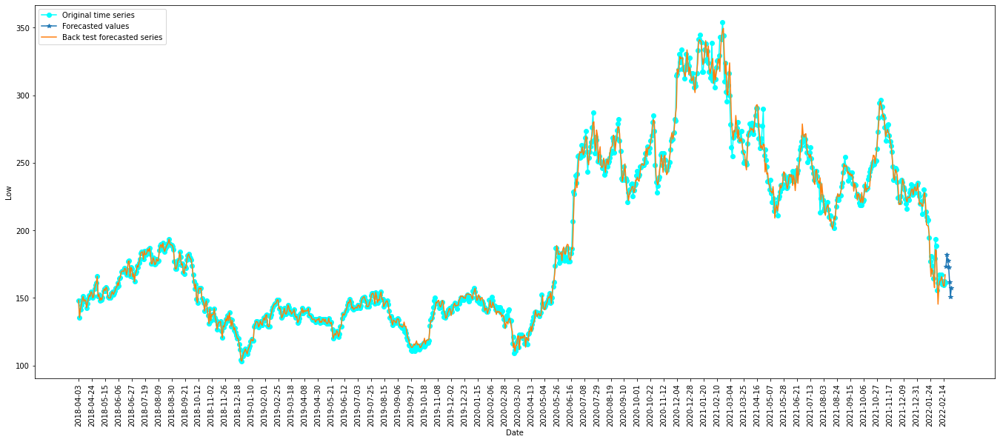

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Close ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  9.90464548528843 -->  4  %
Mean Value of Test Dataset: 226.23396139610387
Forecasted  Close :


,Date,Close
0,2022-02-17,169.3
1,2022-02-18,184.1
2,2022-02-19,184.3
3,2022-02-20,181.8
4,2022-02-21,181.9
5,2022-02-22,177.5
6,2022-02-23,183.7


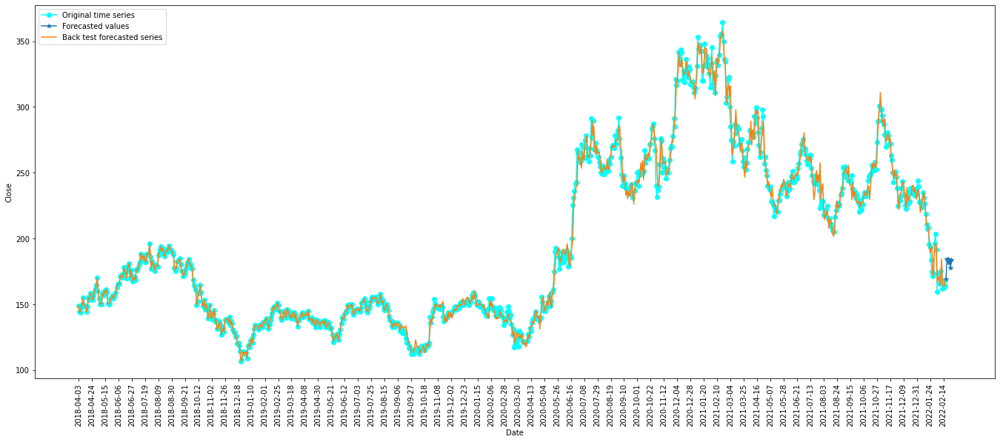

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Adj Close ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  10.287067627828243 -->  4  %
Mean Value of Test Dataset: 224.5485056753247
Forecasted  Adj Close :


,Date,Adj Close
0,2022-02-17,173.4
1,2022-02-18,172.5
2,2022-02-19,165.5
3,2022-02-20,166.5
4,2022-02-21,157.3
5,2022-02-22,149.8
6,2022-02-23,161.1


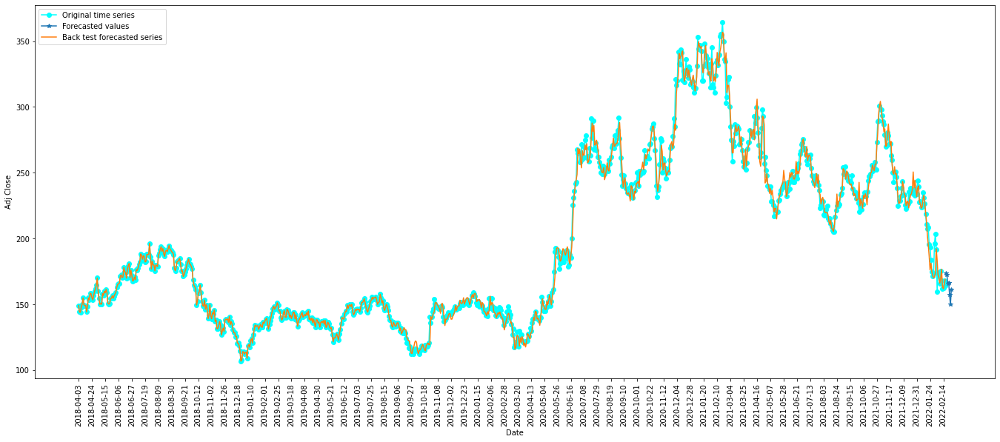

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Volume ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  2401361.657907974 -->  142  %
Mean Value of Test Dataset: 1689065.5844155843
Forecasted  Volume :


,Date,Volume
0,2022-02-17,3525953.4
1,2022-02-18,2438676.0
2,2022-02-19,4567582.8
3,2022-02-20,7383812.6
4,2022-02-21,3770412.0
5,2022-02-22,4115171.5
6,2022-02-23,945333.0


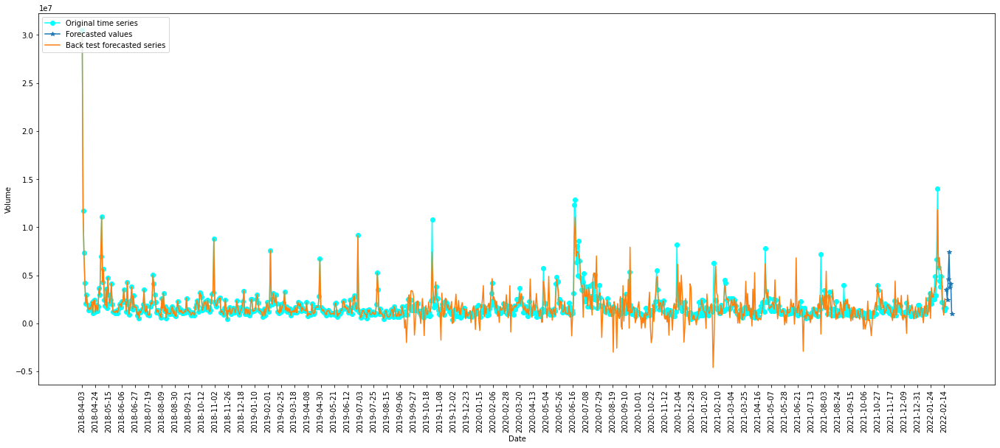

Working on  Pfizer  dataset
Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Open ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  35.15982671111849 -->  9  %
Mean Value of Test Dataset: 378.48509021875
Forecasted  Open :


,Date,Open
0,2022-02-17,947.0
1,2022-02-18,938.1
2,2022-02-19,982.7
3,2022-02-20,894.7
4,2022-02-21,912.3
5,2022-02-22,878.6
6,2022-02-23,874.7


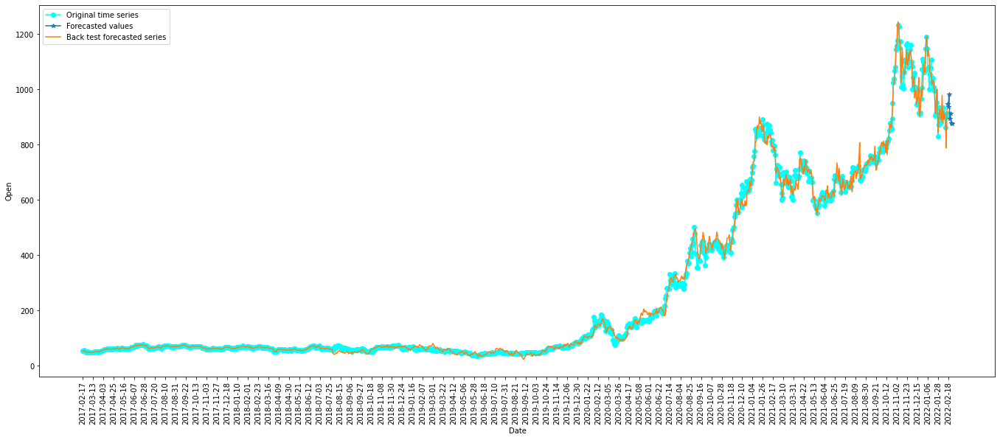

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' High ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  25.705956659476715 -->  6  %
Mean Value of Test Dataset: 367.2305803660714
Forecasted  High :


,Date,High
0,2022-02-17,1016.1
1,2022-02-18,1077.3
2,2022-02-19,1078.4
3,2022-02-20,1063.1
4,2022-02-21,1057.0
5,2022-02-22,1084.0
6,2022-02-23,1071.7


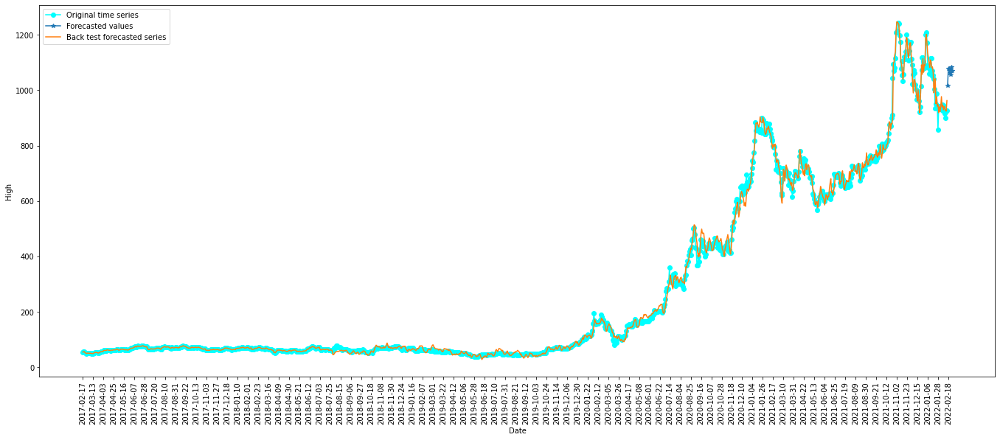

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Low ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  23.97550758520888 -->  7  %
Mean Value of Test Dataset: 340.7595449508929
Forecasted  Low :


,Date,Low
0,2022-02-17,906.1
1,2022-02-18,860.6
2,2022-02-19,791.3
3,2022-02-20,773.0
4,2022-02-21,792.4
5,2022-02-22,785.1
6,2022-02-23,716.9


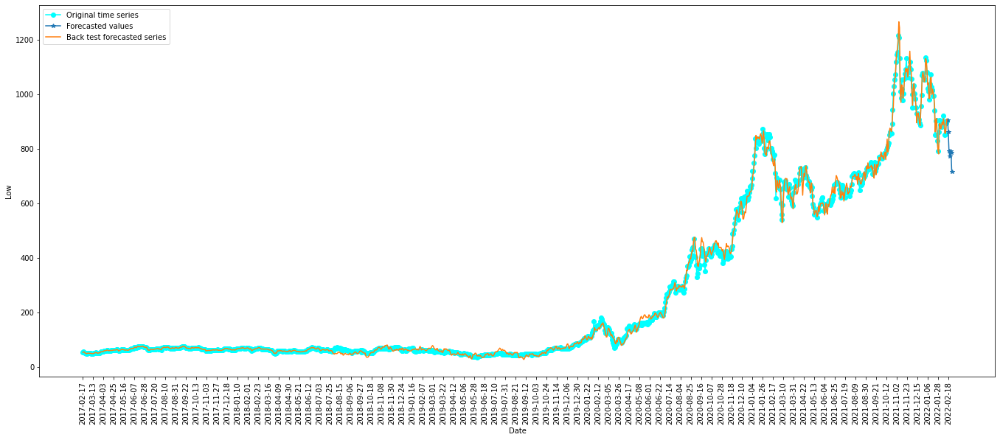

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Close ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  28.434964698981783 -->  8  %
Mean Value of Test Dataset: 331.86507199107143
Forecasted  Close :


,Date,Close
0,2022-02-17,938.3
1,2022-02-18,919.6
2,2022-02-19,769.6
3,2022-02-20,713.5
4,2022-02-21,702.1
5,2022-02-22,664.3
6,2022-02-23,652.3


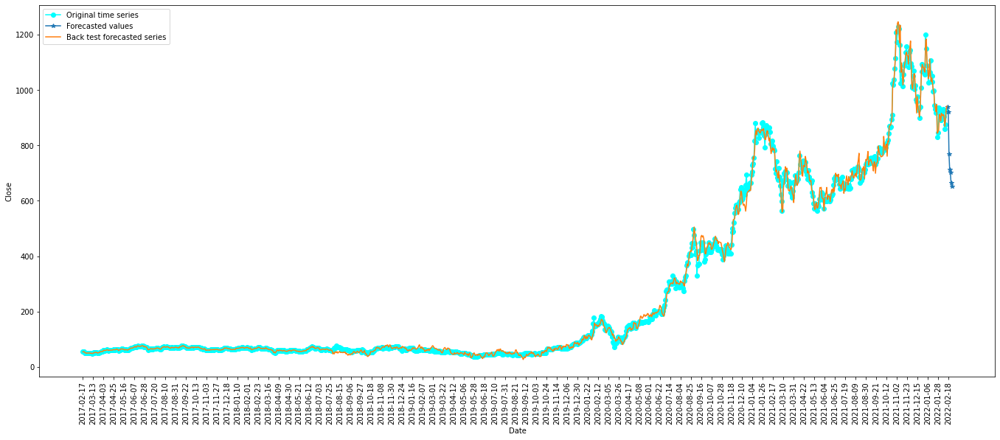

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Adj Close ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  25.45055700214663 -->  7  %
Mean Value of Test Dataset: 343.9189009776786
Forecasted  Adj Close :


,Date,Adj Close
0,2022-02-17,983.9
1,2022-02-18,986.3
2,2022-02-19,945.7
3,2022-02-20,916.8
4,2022-02-21,915.7
5,2022-02-22,877.6
6,2022-02-23,829.2


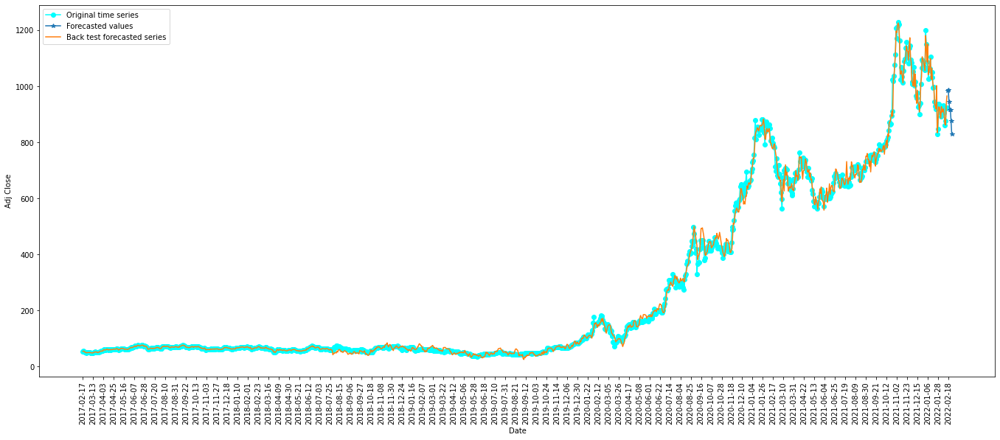

Finding and modelling the  365 -sized pattern in the series using  ElasticNet()
Looking into ' Volume ' series for patterns:
 **************************************************
Root Mean Squared Error between actual and  predicted values:  36892096.45260287 -->  73  %
Mean Value of Test Dataset: 50521547.76785714
Forecasted  Volume :


,Date,Volume
0,2022-02-17,30455414.8
1,2022-02-18,34412843.6
2,2022-02-19,-1757836.7
3,2022-02-20,22405066.6
4,2022-02-21,18293191.9
5,2022-02-22,31132241.6
6,2022-02-23,10916362.0


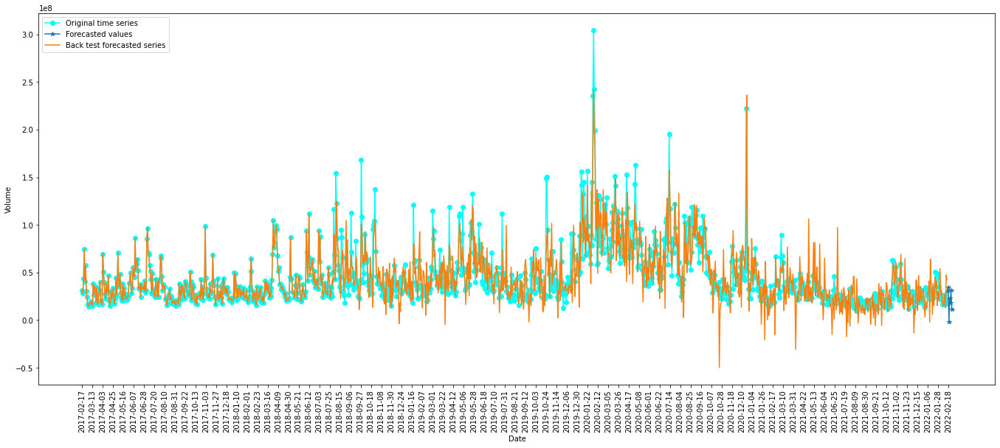

In [66]:
# Auto regressive modelling
# Modeling the pattern using various models

column_names_generated = [] # names of the columns containing the predicted values by prophet
nof = 7 # Number of forecastes (Exta-polation) in forward direction
noa_list = [365] # list for the number of days taken as attributes to model the trend 

#List of the models
prediction_model_list = [linear_model.ElasticNet()] #, LinearRegression(), RandomForestRegressor(max_depth=2, random_state=0)]
# list of the model names
prediction_model_names=["linear_model.ElasticNet", "LinearRegression", "RandomForestRegressor"]

# Temporary list which will assist in concatenation of the processed dataframes corresponding to each data file 
dataframes =[]

# An iterator to access the name of the company in the loop
index = 0


for df in DATA:
    print("Working on ",company_names[index], " dataset")
    for col in df.columns.to_list():
        if col == "Date" or col in column_names_generated:
            pass    
        else:
            for k in range(len(prediction_model_list)): # iterating on the model for forecasting
                
                prediction_model = prediction_model_list[k]
                
                for l in range(len(noa_list)): # iterating on the number of attributes
                    
                    noa = noa_list[l]
                    # some verbos
                    print("Finding and modelling the ",noa,"-sized pattern in the series using ",prediction_model)
                    print("Looking into '",col,"' series for patterns:\n","*"*50)
                    
                    # name for the new column which will be inserted in the dataframe
                    column_name = str(noa)+"_day_model_for_"+col+"_via_"+prediction_model_names[k]
                    column_names_generated.append(column_name)
                    data = df[[col,"Date"]]
                    date_list = data["Date"].to_list()
                    
                    # training the model
                    forcasted, trained_model = train_and_forecast(data[col].to_list(), prediction_model, number_of_forecast = nof, number_of_attributes = noa)
                    # using the trained model to back_test
                    back_forecast = back_test(data[col].to_list(), trained_model, noa)
                    
                    # inserting the new backtested values on the datafram
                    df[column_name] = back_forecast 
                    ori_date_list = date_list.copy()
                    
                    # Ploting the backtest generated values on the actual values of the attribute
                    U = data[col].to_list()
                    forca_date = []
                    d = 0
                    for i in forcasted:
                        d = d+1
                        date_temp = dateutil.parser.parse(date_list[-1]).date()
                        date_temp = date_temp + timedelta(days = d)
                        date_temp = date_temp.strftime('%Y-%m-%d')
                        forca_date.append(date_temp)

                    fig = plt.figure(figsize =(18, 7))
                    ax = fig.add_axes([0,0,1,1])


                    ax.plot(date_list, U,'-o',color='cyan', label = "Original time series")
                    ax.plot(forca_date, forcasted,'-*', label = "Forecasted values")
                    forecasted_df = pd.DataFrame()
                    forecasted_df["Date"] = forca_date
                    forecasted_df[col] = forcasted
                    print("Forecasted ", col,":")
                    display(forecasted_df)
                    ax.plot(ori_date_list, back_forecast,'-', label = "Back test forecasted series")
                    ax.legend(loc="upper left")

                    ax.set_ylabel(col)
                    ax.set_xlabel("Date")
                    ax.set_xticks(ax.get_xticks()[::15])
                    for tick in ax.get_xticklabels():
                      tick.set_rotation(90)

                    plt.show()
                    # end of the plot
                    


In [53]:
# Using prophet to find out the trends (Weekly, Monthy and Yearly)

# An iterator to access the name of the company in the loop
index = 0

for df in DATA:
    print("Working on ",company_names[index], " dataset")
    index = index+1
    for col in df.columns.to_list():
            if col == "Date" or col in column_names_generated:
                pass    
            else:
                print("Prophet on the column: ", col,"\n","*"*50)        
                data = df[[col,"Date"]]
                data.columns = ['y','ds']
                
                # name for the new column which will be inserted in the dataframe
                column_name = "model_for_"+col+"_via_"+"_Prophet"
                column_names_generated.append(column_name)

                data['ds'] = pd.to_datetime(data['ds'])
                train = data.iloc[:len(data)-int(len(data)*0.3)]
                test = data.iloc[len(data)-int(len(data)*0.3)+1:]
                m = Prophet(interval_width = 0.80)
                m.fit(train)
                future = m.make_future_dataframe(periods=7) 
                forecast = m.predict(future)
                res = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
                df[column_name] = forecast['yhat']
                # Model evaluation for prophet
                predictions = forecast.iloc[-len(test):]['yhat']
                print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test['y']), "--> ",int(rmse(predictions,test['y'])*10000/test['y'].mean())/100," %")
                print("Mean Value of Test Dataset:", test['y'].mean())
                
                
                fig1 =plot_plotly(m ,res)
                fig2 =plot_components_plotly(m, forecast)
                fig1.show()
                fig2.show()

# End of prophet modeling

Working on  Pfizer  dataset
Prophet on the column:  Open 
 **************************************************


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Root Mean Squared Error between actual and  predicted values:  10.111991518080087 -->  24.27  %
Mean Value of Test Dataset: 41.65630228457447


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  High 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  10.333732832725307 -->  24.54  %
Mean Value of Test Dataset: 42.1083104787234


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Low 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  9.97292979833699 -->  24.21  %
Mean Value of Test Dataset: 41.17793618617021


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Close 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  10.184624703142498 -->  24.45  %
Mean Value of Test Dataset: 41.64441072606383


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Adj Close 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  11.245221464901203 -->  27.73  %
Mean Value of Test Dataset: 40.55093770478724


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Volume 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  21577567.974815153 -->  62.36  %
Mean Value of Test Dataset: 34600893.55053192


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Working on  Spotify  dataset
Prophet on the column:  Open 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  109.5429920375137 -->  42.56  %
Mean Value of Test Dataset: 257.3493833938356


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  High 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  111.71529567694859 -->  42.62  %
Mean Value of Test Dataset: 262.08880519520545


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Low 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  106.43275939029466 -->  42.27  %
Mean Value of Test Dataset: 251.74898290068495


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Close 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  109.02054856495245 -->  42.47  %
Mean Value of Test Dataset: 256.6968829212329


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Adj Close 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  109.02054856495245 -->  42.47  %
Mean Value of Test Dataset: 256.6968829212329


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Volume 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  1797159.733982701 -->  112.37  %
Mean Value of Test Dataset: 1599217.1232876712


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Working on  Tesla  dataset
Prophet on the column:  Open 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  632.5873243931519 -->  87.4  %
Mean Value of Test Dataset: 723.7671336728723


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  High 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  645.9185233300086 -->  87.32  %
Mean Value of Test Dataset: 739.6978603962766


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Low 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  617.5136242604844 -->  87.43  %
Mean Value of Test Dataset: 706.2392665292552


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Close 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  632.3646949044315 -->  87.36  %
Mean Value of Test Dataset: 723.7924933590425


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Adj Close 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  632.3646949044315 -->  87.36  %
Mean Value of Test Dataset: 723.7924933590425


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prophet on the column:  Volume 
 **************************************************
Root Mean Squared Error between actual and  predicted values:  42323604.58713439 -->  122.24  %
Mean Value of Test Dataset: 34622063.82978723


In [54]:
# An iterator to access the name of the company in the loop
index = 0

for df in DATA:
    print("Working on ",company_names[index], " dataset")
    # Generating the day, month  and year as new columns
    df["Date"] = df["Date"].apply(lambda x : dateutil.parser.parse(x).date())
    df["Year"] = df["Date"].apply(lambda x: x.year)
    df["Month"] = df["Date"].apply(lambda x: x.month)
    df["day_of_month"] = df["Date"].apply(lambda x: x.day)
    df["company"] = company_names[index]
    index = index+1
    dataframes.append(df)
    
# Mearging the processed dataframes generated by the datafiles
df=pd.concat(dataframes)
df.head()

Working on  Pfizer  dataset
Working on  Spotify  dataset
Working on  Tesla  dataset


,Date,Open,High,Low,Close,Adj Close,Volume,365_day_model_for_Open_via_linear_model.ElasticNet,365_day_model_for_High_via_linear_model.ElasticNet,365_day_model_for_Low_via_linear_model.ElasticNet,...,model_for_Open_via__Prophet,model_for_High_via__Prophet,model_for_Low_via__Prophet,model_for_Close_via__Prophet,model_for_Adj Close_via__Prophet,model_for_Volume_via__Prophet,Year,Month,day_of_month,company
0,2017-02-17,31.869070,32.153702,31.812143,31.897533,26.483664,36882306,31.869070,32.153702,31.812143,...,33.054242,33.242404,33.089843,33.122956,27.629665,2.161641e+07,2017,2,17,Pfizer
1,2017-02-21,31.850096,32.068310,31.764706,31.897533,26.483664,25391598,31.850096,32.068310,31.764706,...,33.023784,33.198732,32.995438,33.019553,27.509551,2.203650e+07,2017,2,21,Pfizer
2,2017-02-22,31.850096,32.020874,31.546490,31.869070,26.460030,28676494,31.850096,32.020874,31.546490,...,32.987640,33.162137,32.963643,32.996544,27.483747,2.154567e+07,2017,2,22,Pfizer
3,2017-02-23,31.973434,32.371918,31.859583,32.314991,26.830271,32122863,31.973434,32.371918,31.859583,...,32.897190,33.098878,32.864869,32.925042,27.431108,2.182182e+07,2017,2,23,Pfizer
4,2017-02-24,32.419353,32.590134,32.248577,32.504745,26.987816,26046448,32.419353,32.590134,32.248577,...,32.928878,33.127634,32.924894,33.004198,27.490472,2.348955e+07,2017,2,24,Pfizer


In [55]:
# Initialisation for the dashboard
pn.extension(sizing_mode="stretch_width", comms='colab')
hv.extension("boken")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [56]:
def environment():
    try:
        get_ipython()
        return "notebook"
    except:
        return "server"
environment()

'notebook'

In [57]:
idf = df.interactive()

In [58]:
# Initializing the widgets
year = pn.widgets.IntSlider(name='Year', start=2018, end=2022, step=1)
month = pn.widgets.IntSlider(name='Month', start=1, end=12, step=1)

company = pn.widgets.ToggleGroup(
    name='COMP',
    options=['Tesla', 'Pfizer', 'Spotify'], 
    value=['Tesla', 'Pfizer', 'Spotify'],
    button_type='success')

yaxis =pn.widgets.Select(
    name='Y axis', 
    options=["Open","High","Low","Close","Adj Close","Volume"]+column_names_generated,
    button_type='success'
)



In [59]:
# creating pipeline to give data to dashboard dynamically
ipipeline = (
    idf[
        (idf.Year == year) &
        (idf.Month == month) &
        (idf.company.isin(company))
    ]
    .groupby(['company',"day_of_month"])[yaxis].mean()
    .to_frame()
    .reset_index()
    
    .reset_index(drop=True)
)
ipipeline.head()

In [ ]:
if environment()=="server":
   theme="fast"
else:
   theme="simple"

In [ ]:
itable = ipipeline.pipe(pn.widgets.Tabulator, pagination='remote', page_size=8, theme=theme)
itable

In [ ]:
# making the color profile for the dashboard
PALETTE = ["#ff6f69", "#ffcc5c", "#88d8b0", ]
pn.Row(
    pn.layout.HSpacer(height=50, background=PALETTE[0]),
    pn.layout.HSpacer(height=50, background=PALETTE[1]),
    pn.layout.HSpacer(height=50, background=PALETTE[2]),
)

Row(sizing_mode='stretch_width')
    [0] HSpacer(background='#ff6f69', height=50)
    [1] HSpacer(background='#ffcc5c', height=50)
    [2] HSpacer(background='#88d8b0', height=50)


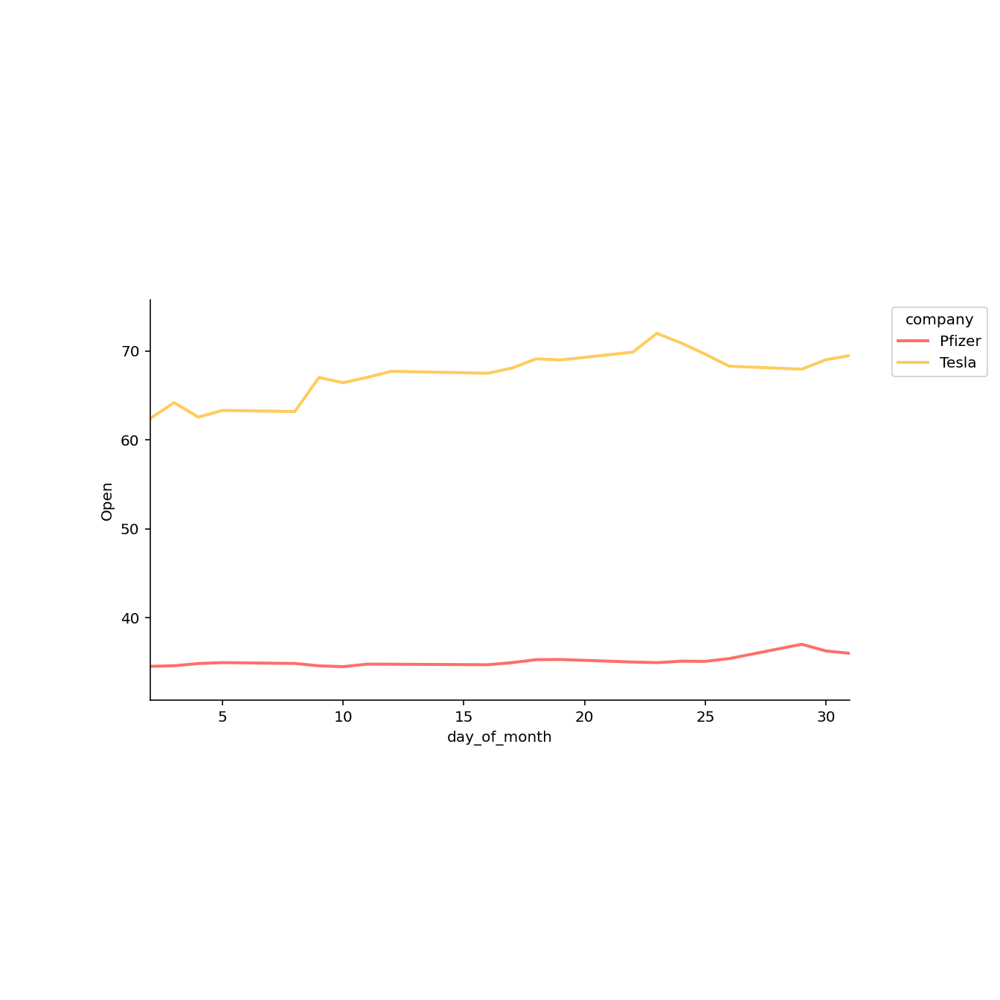

In [ ]:
ihvplot = ipipeline.hvplot(x='day_of_month', y=yaxis, by='company', color=PALETTE, line_width=4, height=400)

ihvplot

In [ ]:
# Show the dashboad
template = pn.template.FastListTemplate(
    title='Interactive Dashboard for stocks', 
    sidebar=[year, month, 'Company', company, 'Stock Attributes' , yaxis],
    main=[ihvplot.panel(), itable.panel()],
    accent_base_color="#88d8b0",
    header_background="#88d8b0",
)
server=pn.serve({"": template}, port=80, address="0.0.0.0", threaded=True, websocket_origin="*")

INFO:bokeh.server.server:Starting Bokeh server version 2.3.3 (running on Tornado 5.1.1)


In [ ]:
!pip install pyngrok --quiet
from pyngrok import ngrok

# Terminate open tunnels if exist
ngrok.kill()

# Setting the authtoken (optional)
# Get your authtoken from https://dashboard.ngrok.com/auth
NGROK_AUTH_TOKEN = "2CNnwVMQMbdF5wVVVHqgtzI6sO3_6dJnRECX7C81DEfD6A5rV"
ngrok.set_auth_token(NGROK_AUTH_TOKEN)

# Open an HTTPs tunnel on port 80 for http://localhost:80
public_url = ngrok.connect(addr="80")
print("Tracking URL:", public_url)

INFO:pyngrok.process:Killing ngrok process: 747
INFO:pyngrok.process:Updating authtoken for default "config_path" of "ngrok_path": /usr/local/lib/python3.7/dist-packages/pyngrok/bin/ngrok
INFO:pyngrok.ngrok:Opening tunnel named: http-80-25e3d825-a81a-4804-baa3-51a8f9cc36f0
INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg="no configuration paths supplied"
INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg="using configuration at default config path" path=/root/.ngrok2/ngrok.yml
INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg="open config file" path=/root/.ngrok2/ngrok.yml err=nil
INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg="starting web service" obj=web addr=127.0.0.1:4040
INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg="tunnel session started" obj=tunnels.session
INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg="client session established" obj=csess id=64054799c517
INFO:pyng

Tracking URL: NgrokTunnel: "http://9a0d-34-139-20-105.ngrok.io" -> "http://localhost:80"


INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg=start pg="/api/tunnels/http-80-25e3d825-a81a-4804-baa3-51a8f9cc36f0 (http)" id=a223e3b310df1511
INFO:pyngrok.process.ngrok:t=2022-07-24T09:05:57+0000 lvl=info msg=end pg="/api/tunnels/http-80-25e3d825-a81a-4804-baa3-51a8f9cc36f0 (http)" id=a223e3b310df1511 status=200 dur=456.695µs


In [ ]:
server.stop()